# データ準備

c:\Users\taki\Desktop\drowsiness_detection_independent
チャンネル:  Fz
----------------------------------------
バンドパスフィルタ:  0.5 - 40.0 Hz
標準化しました。
正規化しました。
外れ値除去しました。
----------------------------------------


0it [00:00, ?it/s]

['12', '1']
12-1 をキーに追加しました
['10', '1']
10-1 をキーに追加しました
['8', '1']
8-1 をキーに追加しました
['13', '2']
13-2 をキーに追加しました
['5', '1']
5-1 をキーに追加しました
['1', '1']
1-1 をキーに追加しました
['3', '2']
3-2 をキーに追加しました
['3', '1']
3-1 をキーに追加しました
['6', '2']


1it [00:00,  3.75it/s]

6-2 をキーに追加しました
['6', '1']
6-1 をキーに追加しました
['2', '1']
2-1 をキーに追加しました
['10', '3']
10-3 をキーに追加しました
['8', '3']
8-3 をキーに追加しました
['14', '3']
14-3 をキーに追加しました
['14', '2']
14-2 をキーに追加しました
['11', '2']
11-2 をキーに追加しました
['11', '3']
11-3 をキーに追加しました
['9', '3']
9-3 をキーに追加しました
['5', '3']


2it [00:00,  3.17it/s]

5-3 をキーに追加しました
['5', '2']
5-2 をキーに追加しました
['7', '3']
7-3 をキーに追加しました
['1', '3']
1-3 をキーに追加しました
['6', '3']
6-3 をキーに追加しました
['4', '3']
4-3 をキーに追加しました
['4', '2']
4-2 をキーに追加しました
['2', '2']
2-2 をキーに追加しました
----------------------------------------
ウィンドウ: 13秒, スライド: 1秒でデータのセグメンテーションが完了しました。
----------------------------------------
データがセグメントされた辞書: split_data_dic
ラベルの取り出し例: label = list(split_data_dic["1-1"])
データの取り出し例: data = split_data_dic["1-1"][label]
セグメントされた行列データ形状:  (588, 6656)
----------------------------------------
セグメントされたデータの取り出しが完了しました。
セグメントされたデータの形状:  (588, 6656)


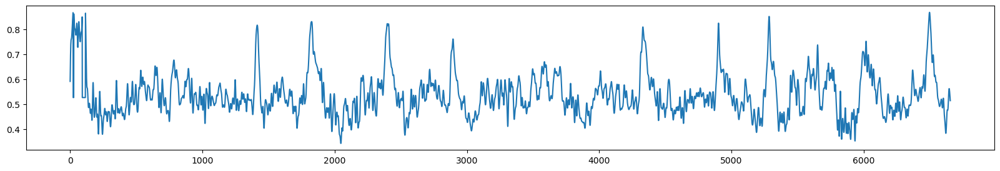

In [1]:

# ディレクトリを親ディレクトリに移動する
# c:\Users\panga\Documents\research\drowsiness_detection_independentにいるのを確認

import os
os.chdir('..')
print(os.getcwd())



# 辞書データの作成
import sys
sys.path.append('./independent_project')  # ライブラリのファイルがあるディレクトリを追加
import load_data, preprocessing, need_utils
import numpy as np


CHANNEL = "Fz"  # チャンネル名
print("チャンネル: ", CHANNEL)

WINDOW_SEC = 13  # 分割するウィンドウサイズ（秒）
OVER_SEC = 12
SLIDE_SEC = WINDOW_SEC - OVER_SEC  # スライドする時間（秒）

# EMGの有効周波数帯は0-500Hzなのでバンドパスフィルタはかけない
BANDPASS = True  # True: バンドパスフィルタをかける / False: バンドパスフィルタをかけない
FS = 512
LOWCUT = 0.5
HIGHCUT = 40.0

STANDARDIZATION = True
NORMALIZATION = True
REMOVE_OUTLIERS = True

DOWNSAMPLING = False  # True: ダウンサンプリングを行う / False: ダウンサンプリングを行わない
FR = 64
CUTOFF = FR/2


# 適用した前処理の表示
print("----------------------------------------")
if BANDPASS:
    print("バンドパスフィルタ: ", f"{LOWCUT} - {HIGHCUT} Hz")
if STANDARDIZATION:
    print("標準化しました。")
if NORMALIZATION:
    print("正規化しました。")
if REMOVE_OUTLIERS:
    print("外れ値除去しました。")
if DOWNSAMPLING:
    print("ダウンサンプリングしました。")
    print("ダウンサンプリング後のサンプリング周波数: ", FR, "Hz")
print("----------------------------------------")


# 被験者の実験データを辞書に格納
data_dic = load_data.create_dataset_for_independent(CHANNEL, BANDPASS, FS, LOWCUT, HIGHCUT, STANDARDIZATION, NORMALIZATION, REMOVE_OUTLIERS, DOWNSAMPLING, CUTOFF, FR, WINDOW_SEC, OVER_SEC)


# 被験者のデータリスト
subj_list = [
    "1-1", "1-3",
    "2-1", "2-2",
    "3-1", "3-2",
    "4-2", "4-3",
    "5-1", "5-2", "5-3",
    "6-1", "6-2", "6-3",
    "7-3",
    "8-1", "8-3",
    "9-3",
    "10-1", "10-3",
    "11-2", "11-3",
    "12-1",
    "13-2",
    "14-2", "14-3"
]



# 辞書内データのセグメンテーション
split_data_dic = preprocessing.split_data_by_subject(data_dic, WINDOW_SEC, SLIDE_SEC)  # 辞書内のデータを分割
print("----------------------------------------")
print("データがセグメントされた辞書: split_data_dic")
print("ラベルの取り出し例: label = list(split_data_dic[\"1-1\"])")  # ラベルの取り出し例
print("データの取り出し例: data = split_data_dic[\"1-1\"][label]")  # データの取り出し例
print("セグメントされた行列データ形状: ", np.array(list(split_data_dic["1-1"].values())[0]).shape)  # 分割されたデータの形状を表示



# セグメントされたデータの取り出し（例）
segments = need_utils.get_segments_from_split_data(split_data_dic, "1-1")
print("セグメントされたデータの形状: ", segments.shape)  # セグメントされたデータの形状を表示 --> (セグメント数, サンプル数)


import matplotlib.pyplot as plt
plt.figure(figsize=(20, 3))
plt.plot(segments[0])
plt.show()


# LZC, PE, Max, Min, Std, Delta, Theta, Alpha, Beta, Theta/Beta, Alpha/Beta

## 通常の変数でLDAとtSNEを可視化

### 関数

In [3]:

import sys
sys.path.append('../independent_project')  # ライブラリのファイルがあるディレクトリを追加
import load_data, preprocessing, need_utils

import numpy as np
import scipy.signal as signal
import scipy.stats as stats
import antropy as ant  # 修正: antropyを使用
import zlib  # 代替LZC実装用
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import os


fs = 512  # サンプリング周波数

# --- 2. 複雑性指標の計算 ---
def compute_lzc(signal):
    """Lempel-Ziv Complexity 計算（antropyが利用できれば使用）"""
    binarized = (signal > np.median(signal)).astype(int)  # バイナリ変換
    binary_str = ''.join(map(str, binarized.tolist()))  # 文字列変換
    try:
        return ant.lziv_complexity(binarized, normalize=True)  # 修正: antropyを使用
    except AttributeError:
        return len(zlib.compress(binary_str.encode())) / len(binary_str)  # 代替実装

def compute_pe(signal):
    """Permutation Entropy 計算"""
    return ant.perm_entropy(signal, order=3, normalize=True)

# --- 3. 周波数成分解析 ---
def compute_bandpower(sig, fs, band):
    """指定した周波数帯のバンドパワーを計算"""
    f, Pxx = signal.welch(sig, fs=fs, nperseg=fs*2)
    band_idx = np.logical_and(f >= band[0], f <= band[1])
    return np.trapz(Pxx[band_idx], f[band_idx])


def extract_features(EEG_data, fs=512):
    bands = {
        'delta': (0.5, 4), 
        'theta': (4, 8), 
        'alpha': (8, 12), 
        'beta': (12, 30)
    }

    features = []
    for i in range(EEG_data.shape[0]):  # 各セグメント
        sig = EEG_data[i, :]
        
        # 統計量
        max_val = np.max(sig)
        min_val = np.min(sig)
        std_val = np.std(sig)

        # バンドパワー
        bandpowers = {name: compute_bandpower(sig, fs, band) for name, band in bands.items()}

        # 周波数比
        theta_beta_ratio = bandpowers['theta'] / bandpowers['beta'] if bandpowers['beta'] != 0 else 0
        alpha_beta_ratio = bandpowers['alpha'] / bandpowers['beta'] if bandpowers['beta'] != 0 else 0

        # 特徴量ベクトル
        feature_row = [
            compute_lzc(sig),
            compute_pe(sig), 
            max_val, min_val, std_val,  # 統計量
            bandpowers['delta'], bandpowers['theta'], bandpowers['alpha'], bandpowers['beta'],  # バンドパワー
            theta_beta_ratio, alpha_beta_ratio  # 周波数比
        ]
        features.append(feature_row)

    return np.array(features)



def plot_lda_coefficients(lda, feature_names):
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(lda.coef_[0])), lda.coef_[0])
    plt.xticks(range(len(lda.coef_[0])), feature_names, rotation=45, ha='right')
    plt.xlabel('Features')
    plt.ylabel('Coefficient Value')
    plt.title('LDA Coefficients')
    plt.tight_layout()
    plt.show()

# Assuming `lda` is the LinearDiscriminantAnalysis model used in visualize_LDA function
feature_names = [
    'LZC', 'PE', 'Max', 'Min', 'Std', 
    'Delta', 'Theta', 'Alpha', 'Beta', 
    'Theta/Beta', 'Alpha/Beta'
]


def visualize_LDA(features, labels, subj_experiments):
    # LDAモデルの作成
    lda = LinearDiscriminantAnalysis(n_components=1)  # 2次元に削減
    X_lda = lda.fit_transform(features, labels)  # 特徴量をLDA空間に変換
    print(lda.coef_)

    # 1D ヒストグラムでクラス分離を確認
    plt.figure(figsize=(8, 5))

    # 覚醒クラス (label=0)
    sns.histplot(X_lda[labels == 0, 0], bins=30, kde=True, color="blue", label="Awake", alpha=0.5)

    # 眠気クラス (label=1)
    sns.histplot(X_lda[labels == 1, 0], bins=30, kde=True, color="red", label="Drowsy", alpha=0.5)

    plt.xlabel("LDA Component 1")
    plt.ylabel("Density")
    plt.title(f"Class Separation with LDA ({subj_experiments})")
    # ディレクトリが存在しない場合は作成
    if not os.path.exists("results"):
        os.makedirs("results")
    plt.savefig(f"results/LDA_{subj_experiments}.png")
    print(f"saved: {os.getcwd}/results/LDA_{subj_experiments}.png")
    plt.show()


    # Call the function to plot LDA coefficients
    plot_lda_coefficients(lda, feature_names)



# visualize_tSNE関数を以下のように修正
def visualize_tSNE(features, labels, subj_experiments):
    """
    t-SNEを使用して特徴量を2次元と3次元に次元削減し、可視化する関数
    :param features: 特徴量のnumpy配列 (サンプル数 x 特徴量数)
    :param labels: ラベルのnumpy配列
    :param subj_experiments: 被験者実験の識別子
    """
    # 2次元t-SNE
    tsne_2d = TSNE(n_components=2, random_state=42)
    X_tsne_2d = tsne_2d.fit_transform(features)

    # 3次元t-SNE
    tsne_3d = TSNE(n_components=3, random_state=42)
    X_tsne_3d = tsne_3d.fit_transform(features)

    # 2D散布図
    plt.figure(figsize=(10, 8))
    plt.scatter(X_tsne_2d[labels == 0, 0], X_tsne_2d[labels == 0, 1], 
                c='blue', label='Awake', alpha=0.5)
    plt.scatter(X_tsne_2d[labels == 1, 0], X_tsne_2d[labels == 1, 1], 
                c='red', label='Drowsy', alpha=0.5)
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.title(f'2D t-SNE Visualization ({subj_experiments})')
    plt.legend()
    
    # 2D結果を保存
    if not os.path.exists("results"):
        os.makedirs("results")
    plt.savefig(f"results/tSNE_2D_{subj_experiments}.png")
    print(f"saved: {os.getcwd()}/results/tSNE_2D_{subj_experiments}.png")
    plt.show()

    # 3D散布図（インタラクティブ）
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 覚醒クラス (label=0)
    scatter1 = ax.scatter(X_tsne_3d[labels == 0, 0], X_tsne_3d[labels == 0, 1], X_tsne_3d[labels == 0, 2],
                         c='blue', label='Awake', alpha=0.5)
    
    # 眠気クラス (label=1)
    scatter2 = ax.scatter(X_tsne_3d[labels == 1, 0], X_tsne_3d[labels == 1, 1], X_tsne_3d[labels == 1, 2],
                         c='red', label='Drowsy', alpha=0.5)
    
    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title(f'3D t-SNE Visualization ({subj_experiments})')
    plt.legend()
    
    # 3D結果を保存（複数の角度から）
    if not os.path.exists("results"):
        os.makedirs("results")
    
    # 異なる角度からスクリーンショットを保存
    angles = [0, 45, 90, 135]
    for angle in angles:
        ax.view_init(elev=20, azim=angle)
        plt.savefig(f"results/tSNE_3D_{subj_experiments}_angle_{angle}.png")
        print(f"saved: {os.getcwd()}/results/tSNE_3D_{subj_experiments}_angle_{angle}.png")
    
    plt.show()

### 実行

['1-1', '1-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[-9.57046587e+01  2.52439847e+01 -1.51389684e+03 -1.08566588e+02
   2.67170886e+03 -1.66143364e+04 -1.12315524e+04 -4.21985127e+04
  -3.74235031e+04 -9.61665597e+00  1.66228418e+01]]
saved: <built-in function getcwd>/results/LDA_['1-1', '1-3'].png


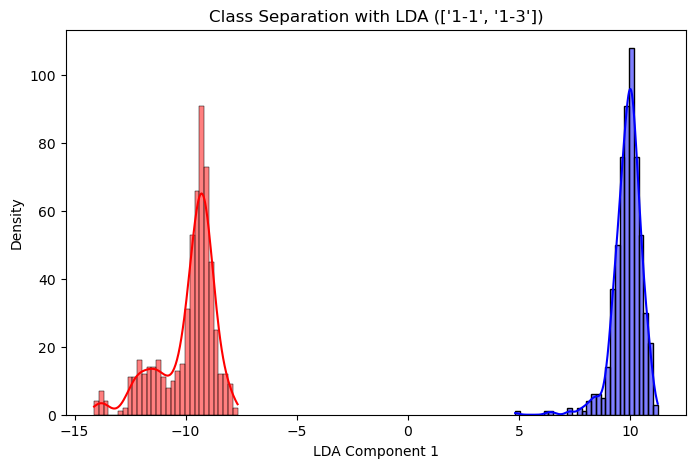

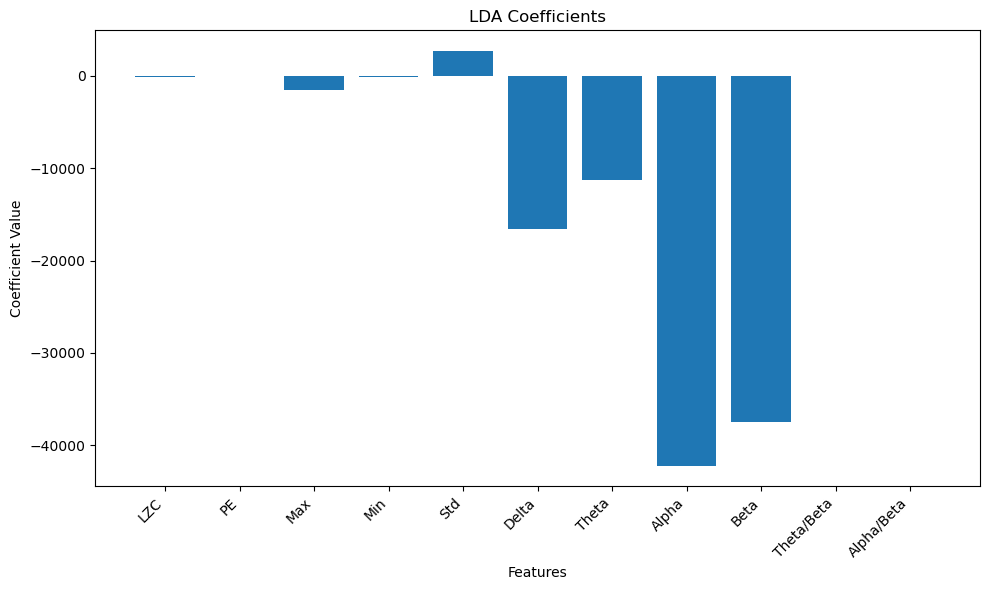

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['1-1', '1-3'].png


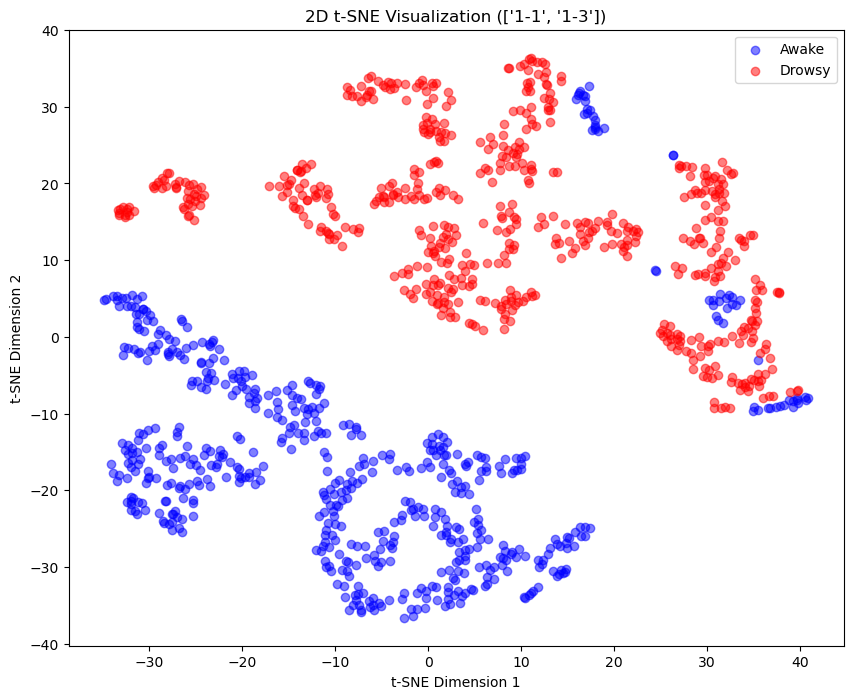

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['1-1', '1-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['1-1', '1-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['1-1', '1-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['1-1', '1-3']_angle_135.png


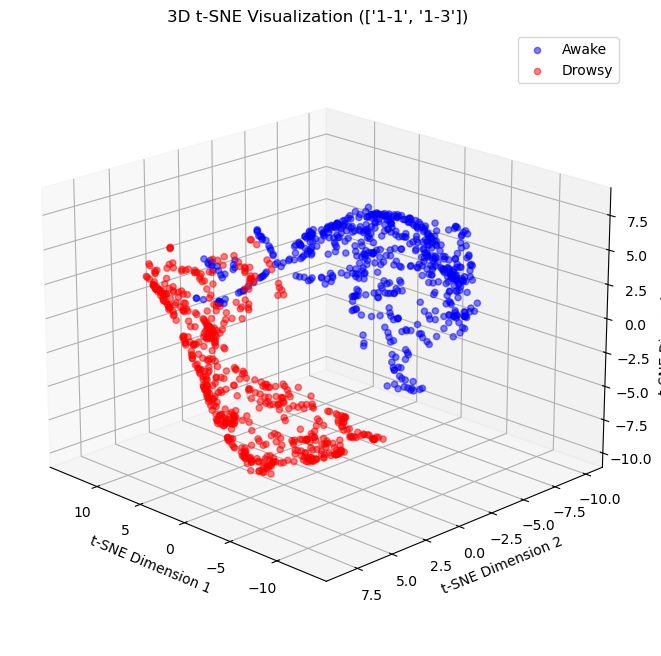

['2-1', '2-2']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[ 7.72139152e+01  7.75663783e+02  1.76831568e+02  7.03304626e+00
   1.34653064e+03 -3.74958510e+03 -4.69690649e+04  2.22328101e+04
   6.22481783e+04  2.53519630e+01 -2.85632288e+01]]
saved: <built-in function getcwd>/results/LDA_['2-1', '2-2'].png


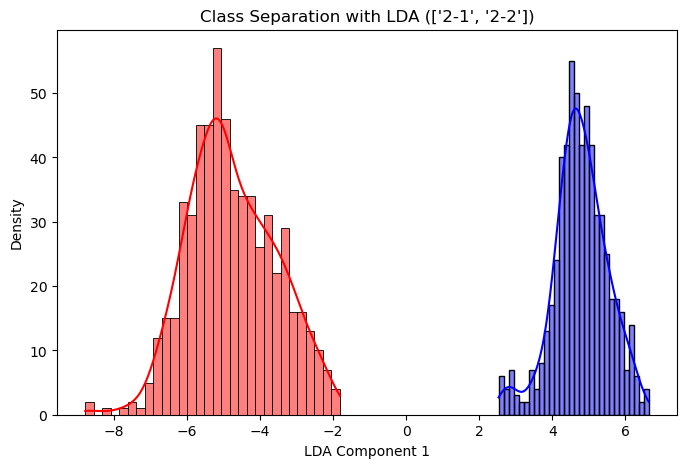

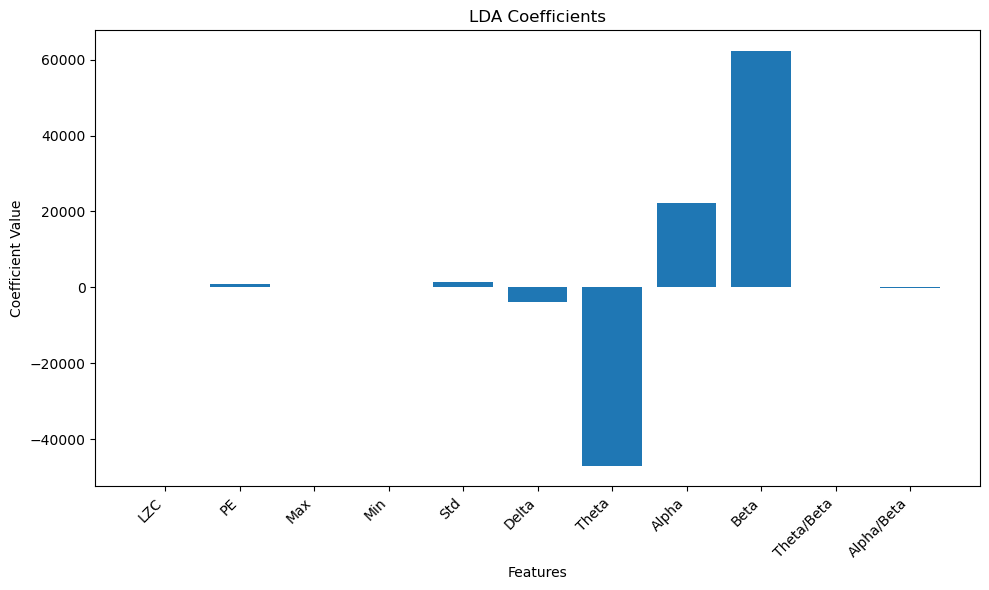

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['2-1', '2-2'].png


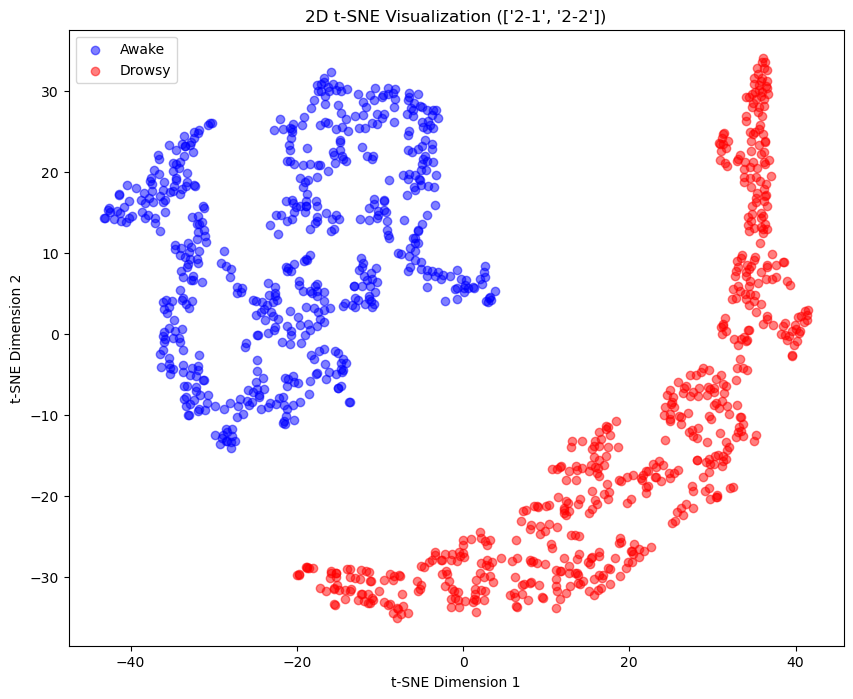

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_135.png


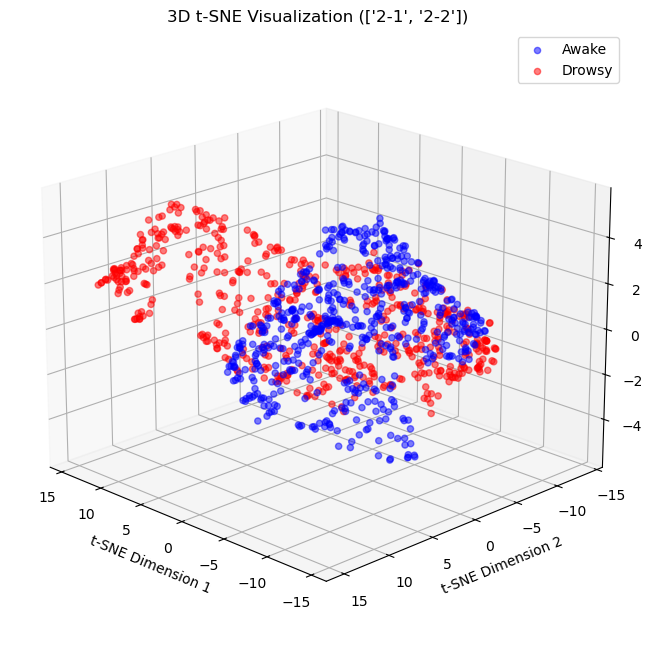

['5-1', '5-2', '5-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[ 3.30360563e+01 -1.73056172e+02  1.75199196e+01  3.62177616e+01
   3.73803616e+02 -1.35637072e+03 -5.66852816e+03 -2.20505847e+04
   1.10040806e+04  2.38947815e+00  1.16806416e+01]]
saved: <built-in function getcwd>/results/LDA_['5-1', '5-2', '5-3'].png


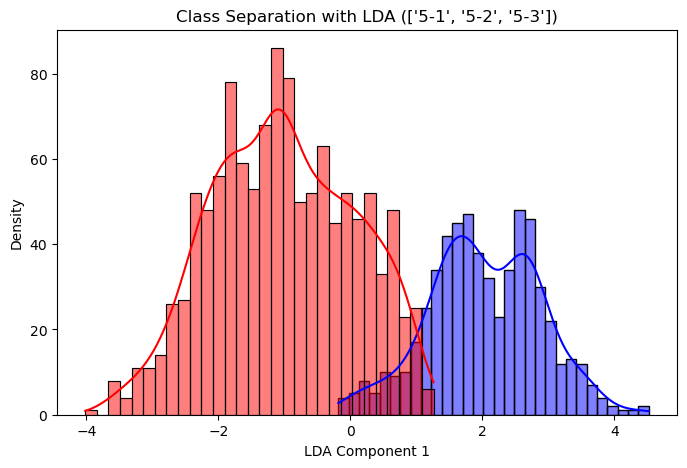

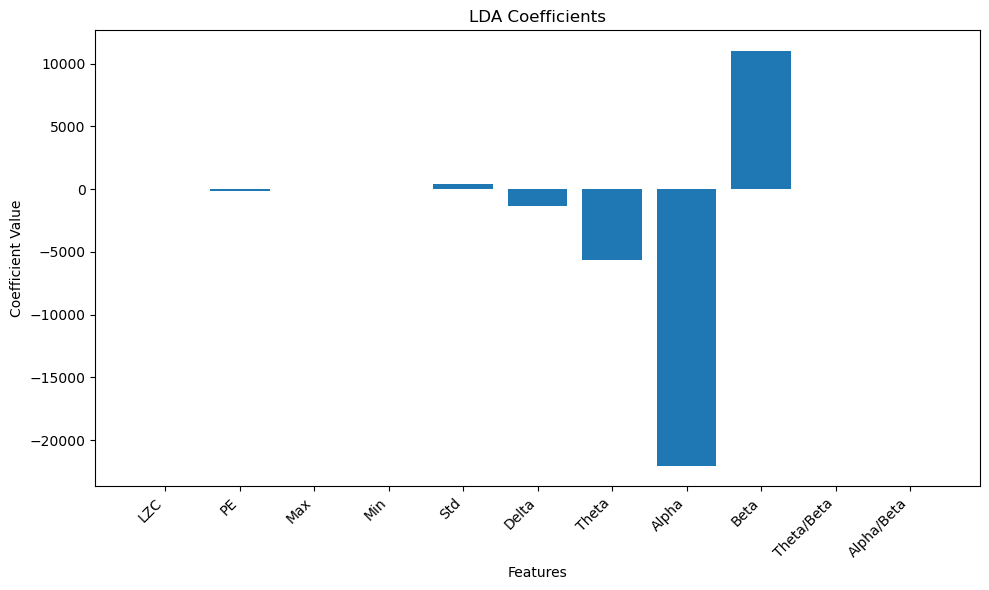

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['5-1', '5-2', '5-3'].png


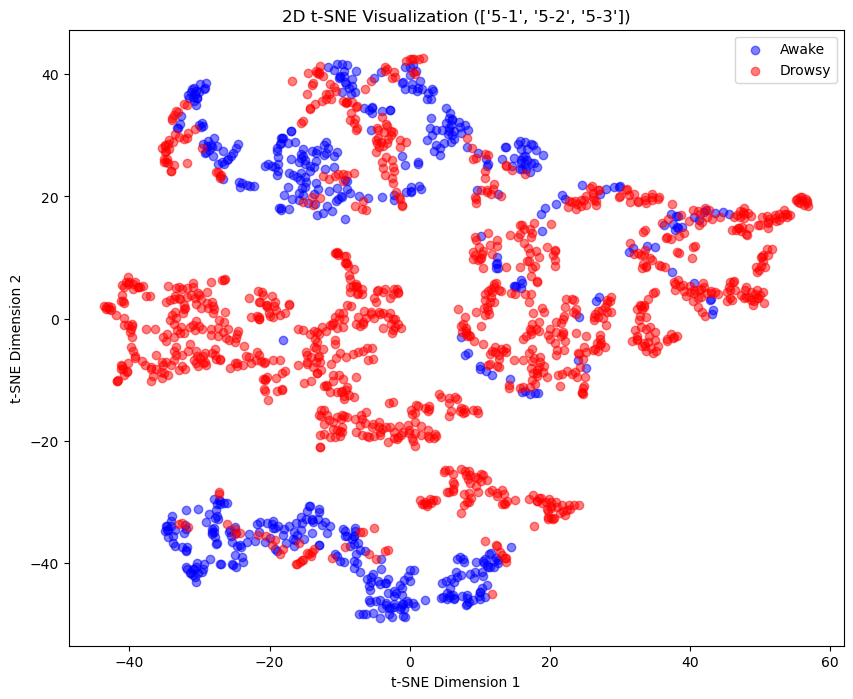

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_135.png


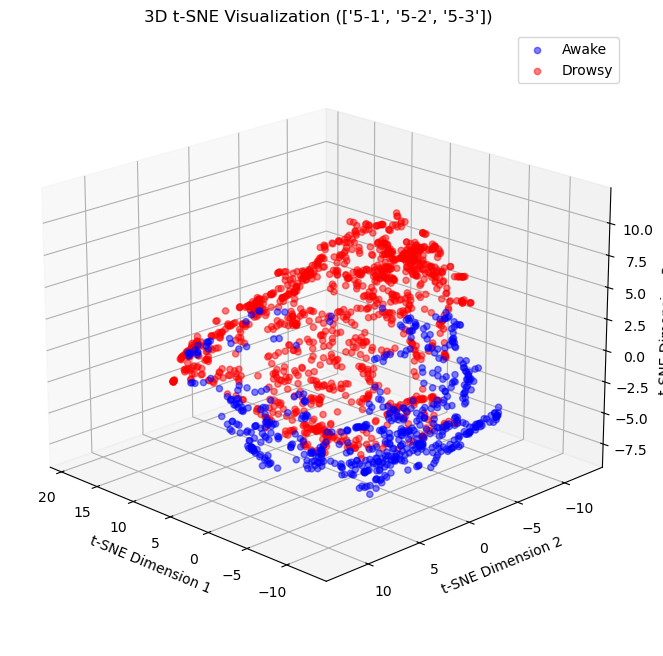

['6-1', '6-2', '6-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[-3.04066668e+01 -1.44037413e+03  1.22029173e+02  1.46493132e+01
  -7.95204826e+02  7.01420448e+03 -6.45052521e+04 -5.04666383e+04
   8.46159045e+04  2.08042603e+01  7.94815020e+00]]
saved: <built-in function getcwd>/results/LDA_['6-1', '6-2', '6-3'].png


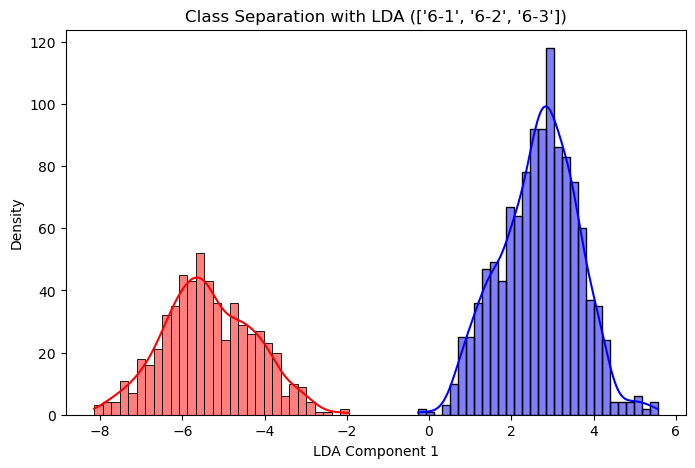

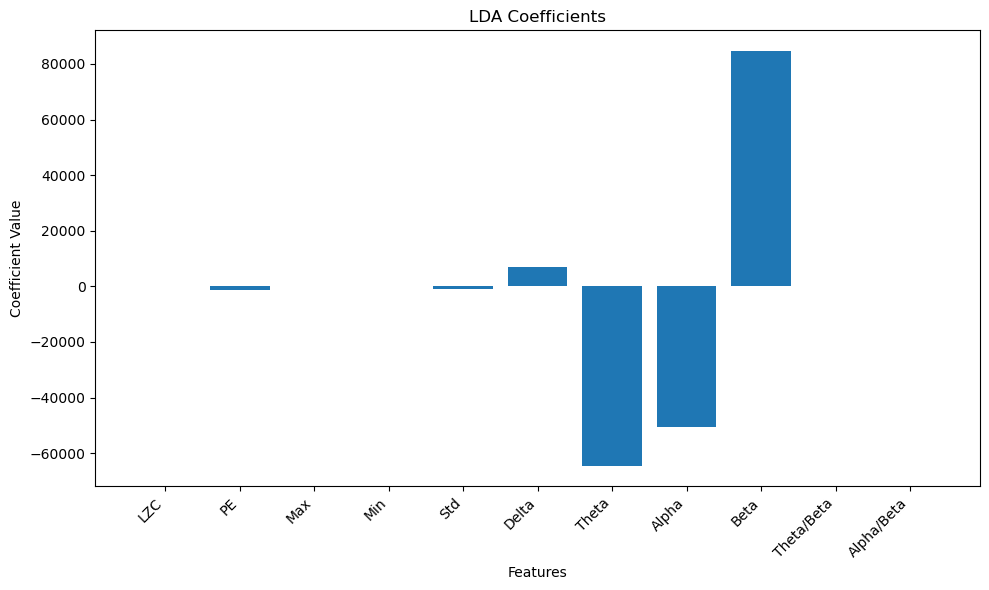

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['6-1', '6-2', '6-3'].png


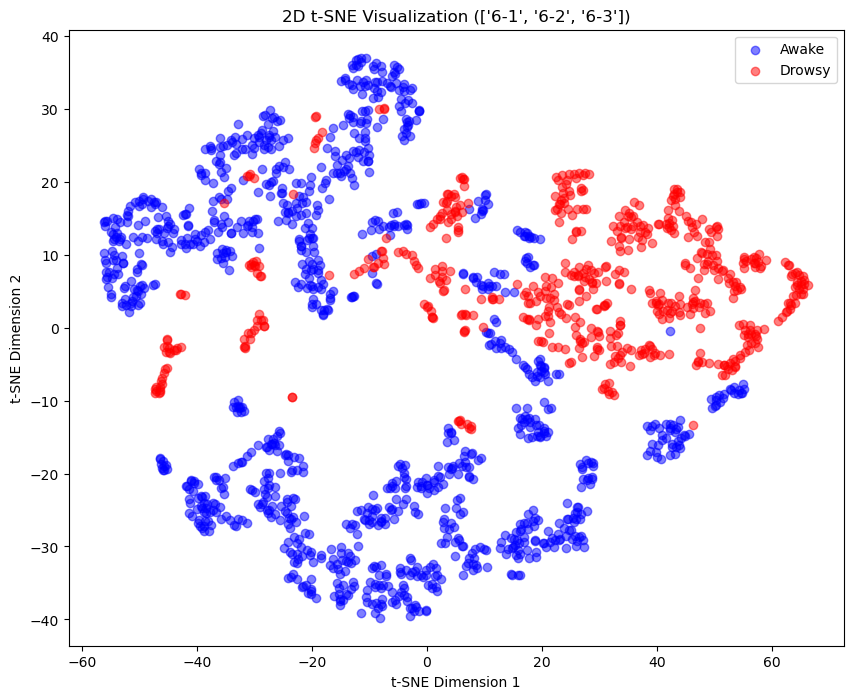

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_135.png


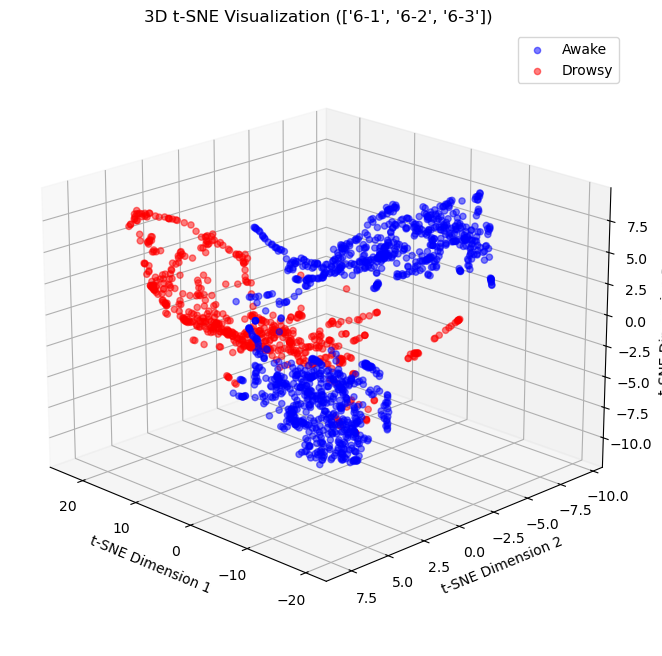

['8-1', '8-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[ 7.34234965e+01 -8.55813767e+02  1.49090710e+03  2.84266505e+02
   7.21159573e+02 -1.27760409e+04 -6.41513332e+04  1.74340905e+05
   1.06372537e+05  2.09460554e+01 -3.05916724e+01]]
saved: <built-in function getcwd>/results/LDA_['8-1', '8-3'].png


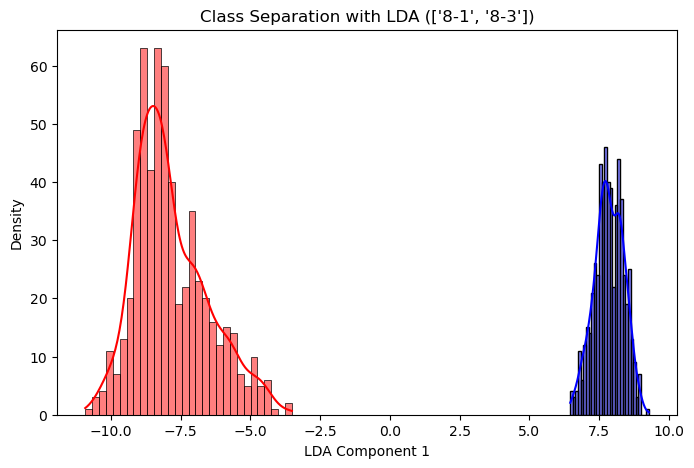

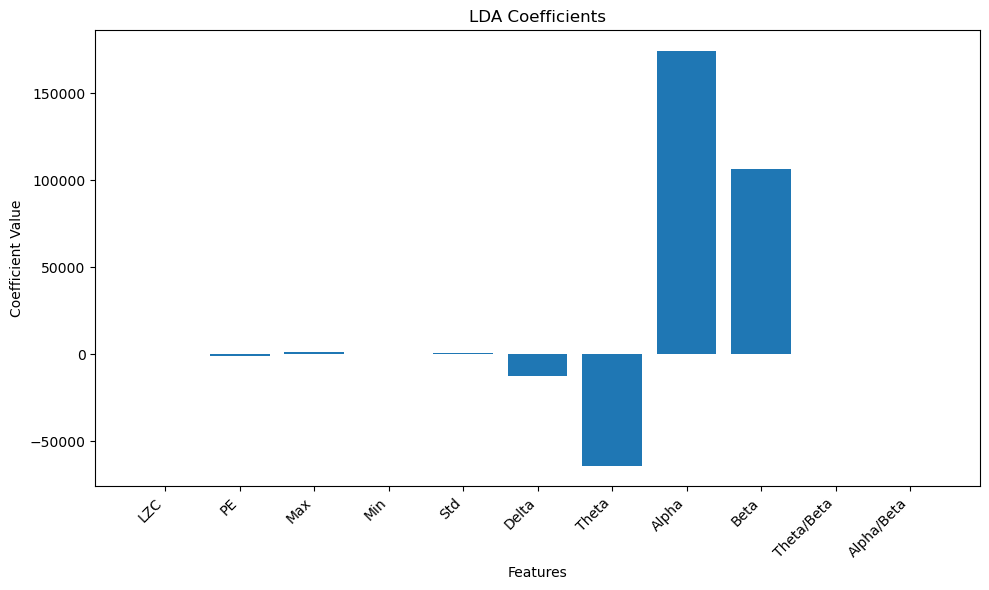

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['8-1', '8-3'].png


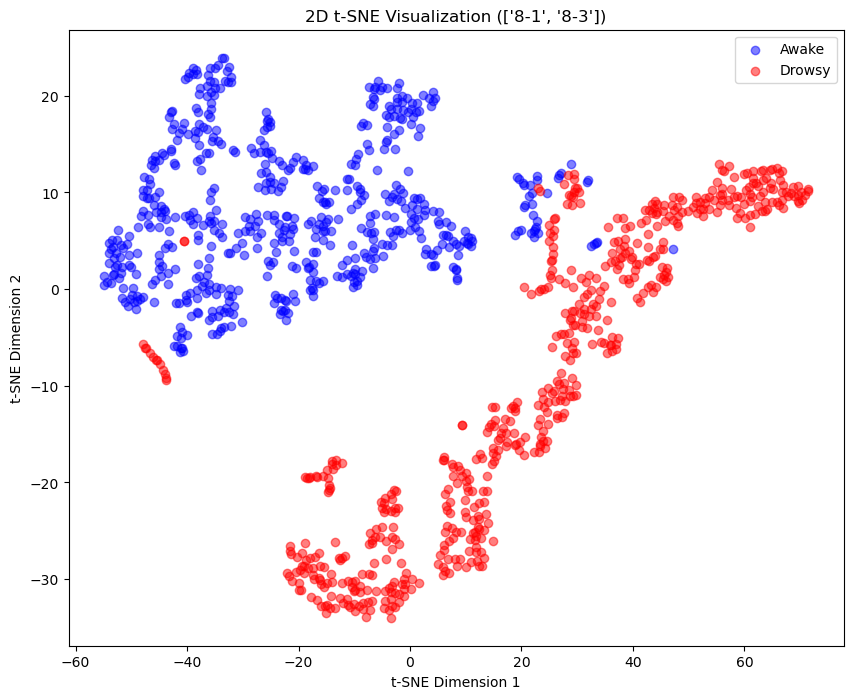

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_135.png


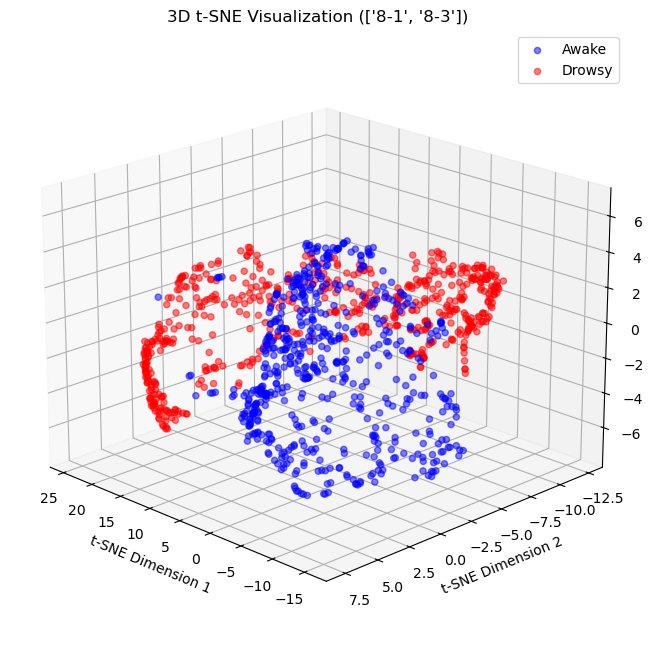

['10-1', '10-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
[[ 2.64579105e+01  1.39745914e+02  1.11530274e+03  1.32780137e+01
   4.84419305e+02 -2.12828143e+03 -4.22786936e+04  1.62044698e+04
   3.49315409e+04  3.31536068e+01 -1.67837442e+01]]
saved: <built-in function getcwd>/results/LDA_['10-1', '10-3'].png


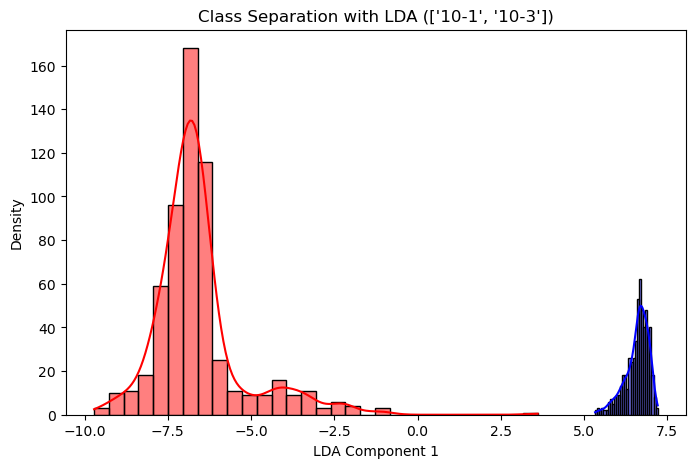

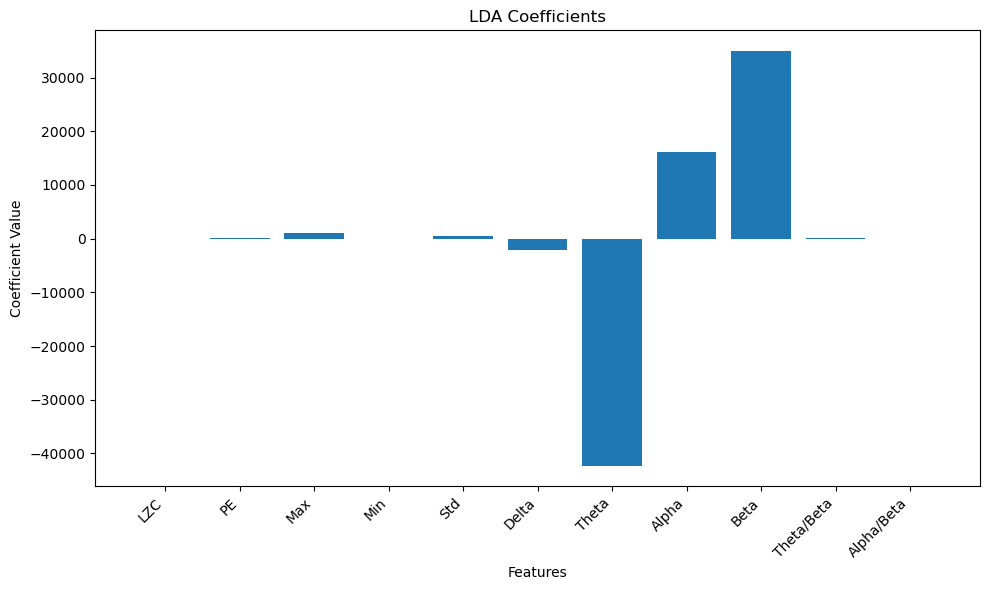

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['10-1', '10-3'].png


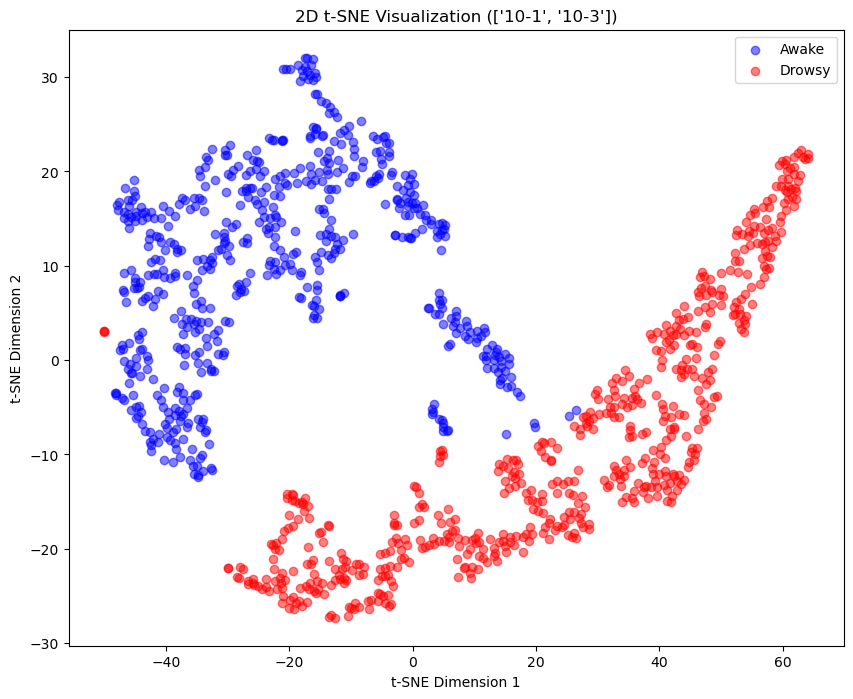

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_135.png


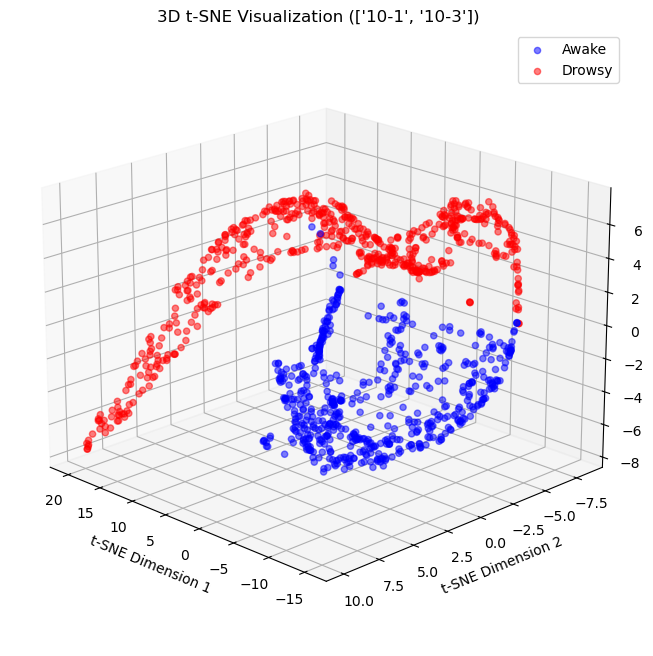

In [5]:

subj_list = [
    ["1-1", "1-3"], 
    ["2-1", "2-2"], 
    # ["3-1", "3-2"],
    # ["4-2", "4-3"],
    ["5-1", "5-2", "5-3"],
    ["6-1", "6-2", "6-3"],
    # ["7-3"],
    ["8-1", "8-3"],
    # ["9-3"],
    ["10-1", "10-3"],
    # ["11-2", "11-3"],
    # ["12-1"],
    # ["13-2"],
    # ["14-2", "14-3"]
]

for experiments in subj_list:
    print(experiments)
    if len(experiments) > 1:
        all_features = []
        all_labels = []
        for subj_experiment in experiments:
            segments = need_utils.get_segments_from_split_data(split_data_dic, subj_experiment)
            label = list(split_data_dic[subj_experiment].keys()) * len(segments)
            EEG_data = np.array(segments)
            labels = np.array(label)

            try:
                # 被験者ごとに特徴量を抽出
                features = extract_features(EEG_data)
                # 被験者ごとに特徴量を正規化
                # features = normalize_features(features)
                all_features.append(features)
                all_labels.append(labels)
            except:
                continue
        if len(np.unique(all_labels)) > 1:
            # 特徴量とラベルを結合
            features_concat = np.concatenate(all_features)
            labels_concat = np.concatenate(all_labels)
            
            # LDAによる可視化
            visualize_LDA(features_concat, labels_concat, experiments)
            
            # t-SNEによる可視化
            visualize_tSNE(features_concat, labels_concat, experiments)

# 被験者非依存 

## LZC, PE, Max, Min, Std, Delta, Theta, Alpha, Beta, Theta/Beta, Alpha/Beta

### 関数

In [12]:

import sys
sys.path.append('../independent_project')  # ライブラリのファイルがあるディレクトリを追加
import load_data, preprocessing, need_utils

import numpy as np
import scipy.signal as signal
import scipy.stats as stats
import antropy as ant  # 修正: antropyを使用
import zlib  # 代替LZC実装用
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import os


fs = 512  # サンプリング周波数

# --- 2. 複雑性指標の計算 ---
def compute_lzc(signal):
    """Lempel-Ziv Complexity 計算（antropyが利用できれば使用）"""
    binarized = (signal > np.median(signal)).astype(int)  # バイナリ変換
    binary_str = ''.join(map(str, binarized.tolist()))  # 文字列変換
    try:
        return ant.lziv_complexity(binarized, normalize=True)  # 修正: antropyを使用
    except AttributeError:
        return len(zlib.compress(binary_str.encode())) / len(binary_str)  # 代替実装

def compute_pe(signal):
    """Permutation Entropy 計算"""
    return ant.perm_entropy(signal, order=3, normalize=True)

# --- 3. 周波数成分解析 ---
def compute_bandpower(sig, fs, band):
    """指定した周波数帯のバンドパワーを計算"""
    f, Pxx = signal.welch(sig, fs=fs, nperseg=fs*2)
    band_idx = np.logical_and(f >= band[0], f <= band[1])
    return np.trapz(Pxx[band_idx], f[band_idx])


def extract_features(EEG_data, fs=512):
    bands = {
        'delta': (0.5, 4), 
        'theta': (4, 8), 
        'alpha': (8, 12), 
        'beta': (12, 30)
    }

    features = []
    for i in range(EEG_data.shape[0]):  # 各セグメント
        sig = EEG_data[i, :]
        
        # 統計量
        max_val = np.max(sig)
        min_val = np.min(sig)
        std_val = np.std(sig)

        # バンドパワー
        bandpowers = {name: compute_bandpower(sig, fs, band) for name, band in bands.items()}

        # 周波数比
        theta_beta_ratio = bandpowers['theta'] / bandpowers['beta'] if bandpowers['beta'] != 0 else 0
        alpha_beta_ratio = bandpowers['alpha'] / bandpowers['beta'] if bandpowers['beta'] != 0 else 0

        # 特徴量ベクトル
        feature_row = [
            compute_lzc(sig),
            compute_pe(sig), 
            max_val, min_val, std_val,  # 統計量
            bandpowers['delta'], bandpowers['theta'], bandpowers['alpha'], bandpowers['beta'],  # バンドパワー
            theta_beta_ratio, alpha_beta_ratio  # 周波数比
        ]
        features.append(feature_row)

    return np.array(features)



def plot_lda_coefficients(lda, feature_names):
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(lda.coef_[0])), lda.coef_[0])
    plt.xticks(range(len(lda.coef_[0])), feature_names, rotation=45, ha='right')
    plt.xlabel('Features')
    plt.ylabel('Coefficient Value')
    plt.title('LDA Coefficients')
    plt.tight_layout()
    plt.show()

# Assuming `lda` is the LinearDiscriminantAnalysis model used in visualize_LDA function
feature_names = [
    'LZC', 'PE', 'Max', 'Min', 'Std', 
    'Delta', 'Theta', 'Alpha', 'Beta', 
    'Theta/Beta', 'Alpha/Beta'
]


def visualize_LDA(features, labels, subj_experiments):
    # LDAモデルの作成
    lda = LinearDiscriminantAnalysis(n_components=1)  # 2次元に削減
    X_lda = lda.fit_transform(features, labels)  # 特徴量をLDA空間に変換
    print(lda.coef_)

    # 1D ヒストグラムでクラス分離を確認
    plt.figure(figsize=(8, 5))

    # 覚醒クラス (label=0)
    sns.histplot(X_lda[labels == 0, 0], bins=30, kde=True, color="blue", label="Awake", alpha=0.5)

    # 眠気クラス (label=1)
    sns.histplot(X_lda[labels == 1, 0], bins=30, kde=True, color="red", label="Drowsy", alpha=0.5)

    plt.xlabel("LDA Component 1")
    plt.ylabel("Density")
    plt.title(f"Class Separation with LDA ({subj_experiments})")
    # ディレクトリが存在しない場合は作成
    if not os.path.exists("results"):
        os.makedirs("results")
    plt.savefig(f"results/LDA_{subj_experiments}.png")
    print(f"saved: {os.getcwd}/results/LDA_{subj_experiments}.png")
    plt.show()


    # Call the function to plot LDA coefficients
    plot_lda_coefficients(lda, feature_names)

    return lda



# visualize_tSNE関数を以下のように修正
def visualize_tSNE(features, labels, subj_experiments):
    """
    t-SNEを使用して特徴量を2次元と3次元に次元削減し、可視化する関数
    :param features: 特徴量のnumpy配列 (サンプル数 x 特徴量数)
    :param labels: ラベルのnumpy配列
    :param subj_experiments: 被験者実験の識別子
    """
    # 2次元t-SNE
    tsne_2d = TSNE(n_components=2, random_state=42)
    X_tsne_2d = tsne_2d.fit_transform(features)

    # 3次元t-SNE
    tsne_3d = TSNE(n_components=3, random_state=42)
    X_tsne_3d = tsne_3d.fit_transform(features)

    # 2D散布図
    plt.figure(figsize=(10, 8))
    plt.scatter(X_tsne_2d[labels == 0, 0], X_tsne_2d[labels == 0, 1], 
                c='blue', label='Awake', alpha=0.5)
    plt.scatter(X_tsne_2d[labels == 1, 0], X_tsne_2d[labels == 1, 1], 
                c='red', label='Drowsy', alpha=0.5)
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.title(f'2D t-SNE Visualization ({subj_experiments})')
    plt.legend()
    
    # 2D結果を保存
    if not os.path.exists("results"):
        os.makedirs("results")
    plt.savefig(f"results/tSNE_2D_{subj_experiments}.png")
    print(f"saved: {os.getcwd()}/results/tSNE_2D_{subj_experiments}.png")
    plt.show()

    # 3D散布図（インタラクティブ）
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # 覚醒クラス (label=0)
    scatter1 = ax.scatter(X_tsne_3d[labels == 0, 0], X_tsne_3d[labels == 0, 1], X_tsne_3d[labels == 0, 2],
                         c='blue', label='Awake', alpha=0.5)
    
    # 眠気クラス (label=1)
    scatter2 = ax.scatter(X_tsne_3d[labels == 1, 0], X_tsne_3d[labels == 1, 1], X_tsne_3d[labels == 1, 2],
                         c='red', label='Drowsy', alpha=0.5)
    
    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title(f'3D t-SNE Visualization ({subj_experiments})')
    plt.legend()
    
    # 3D結果を保存（複数の角度から）
    if not os.path.exists("results"):
        os.makedirs("results")
    
    # 異なる角度からスクリーンショットを保存
    angles = [0, 45, 90, 135]
    for angle in angles:
        ax.view_init(elev=20, azim=angle)
        plt.savefig(f"results/tSNE_3D_{subj_experiments}_angle_{angle}.png")
        print(f"saved: {os.getcwd()}/results/tSNE_3D_{subj_experiments}_angle_{angle}.png")
    
    plt.show()

    return tsne_2d, tsne_3d

### train

['2-1', '2-2']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (1176, 11)
ラベルの形状: (1176,)
[[ 7.72139152e+01  7.75663783e+02  1.76831568e+02  7.03304626e+00
   1.34653064e+03 -3.74958510e+03 -4.69690649e+04  2.22328101e+04
   6.22481783e+04  2.53519630e+01 -2.85632288e+01]]
saved: <built-in function getcwd>/results/LDA_['2-1', '2-2'].png


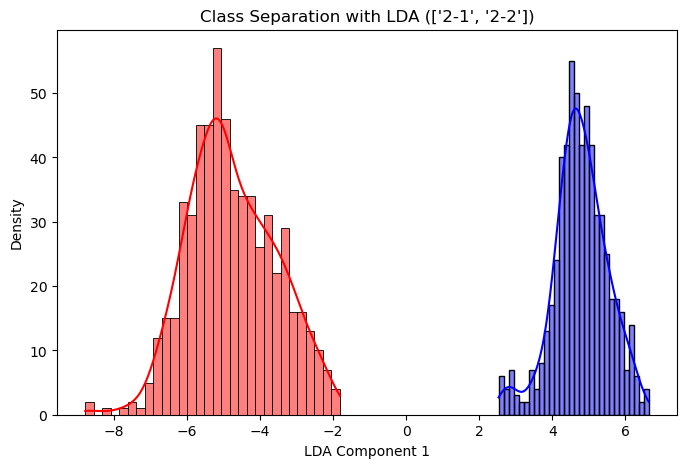

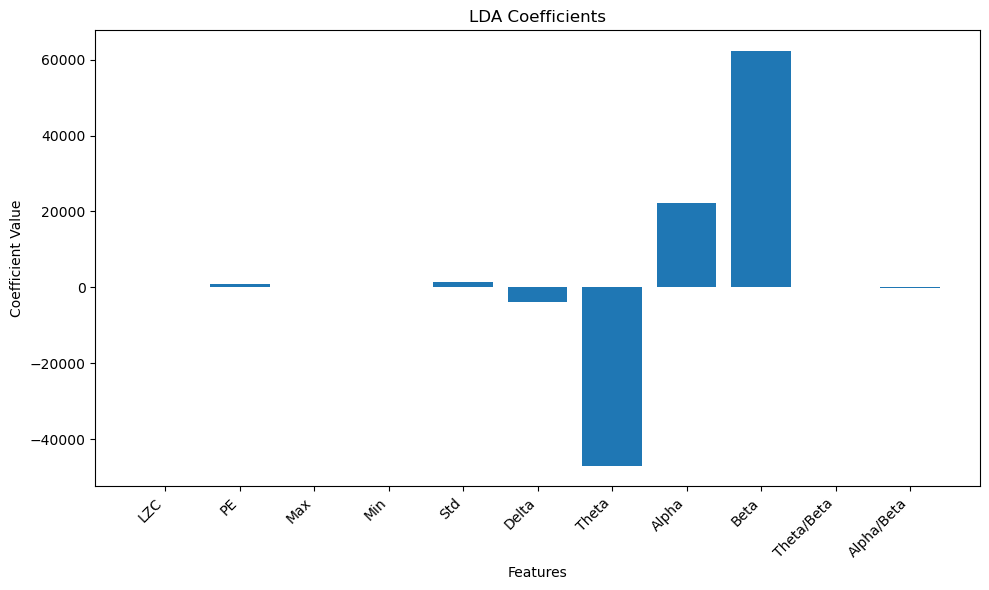

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['2-1', '2-2'].png


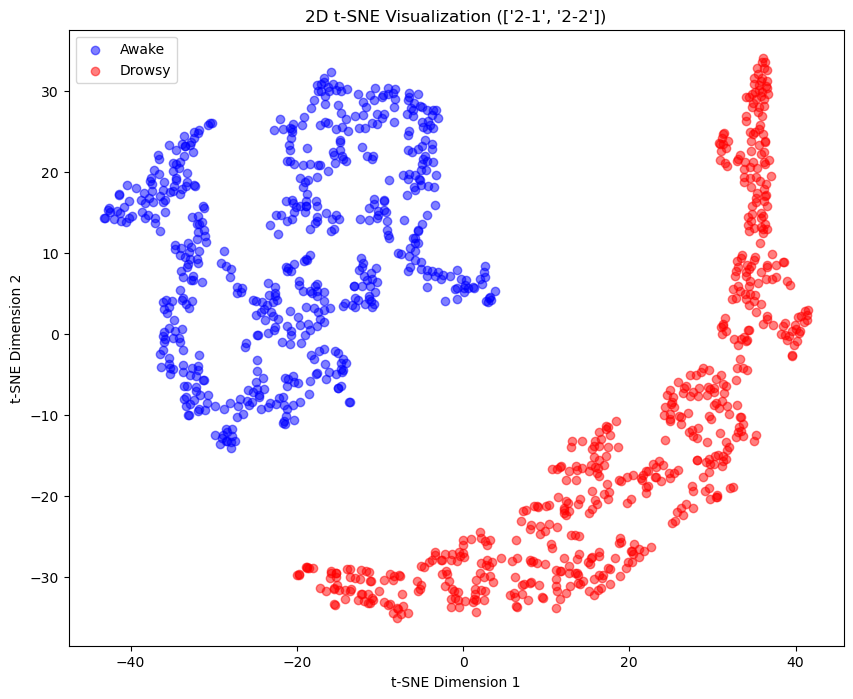

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['2-1', '2-2']_angle_135.png


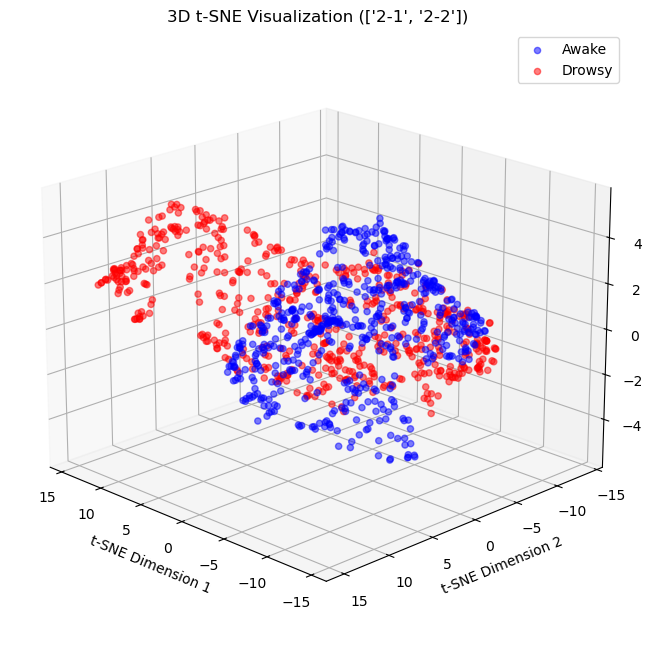

['3-1', '3-2']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (2352, 11)
ラベルの形状: (2352,)
[[-1.19675614e+01 -4.67394947e+01  2.24812616e+02 -1.74176584e+01
   8.23960484e+02 -7.19191402e+02  6.39326295e+03 -1.05914858e+05
   2.35370820e+04 -7.21567671e+00  1.93453183e+01]]
saved: <built-in function getcwd>/results/LDA_['3-1', '3-2'].png


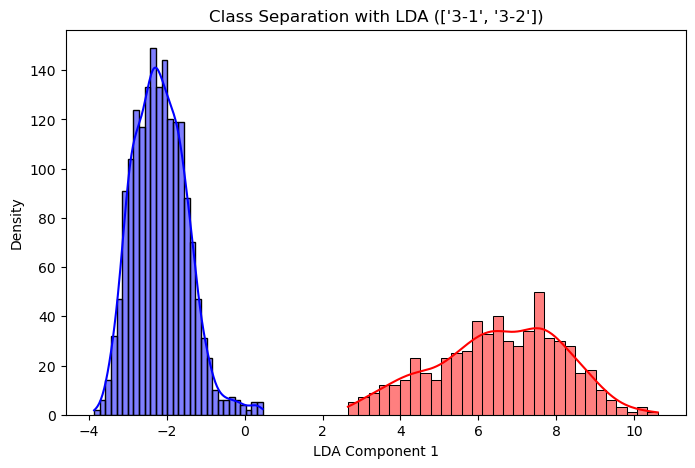

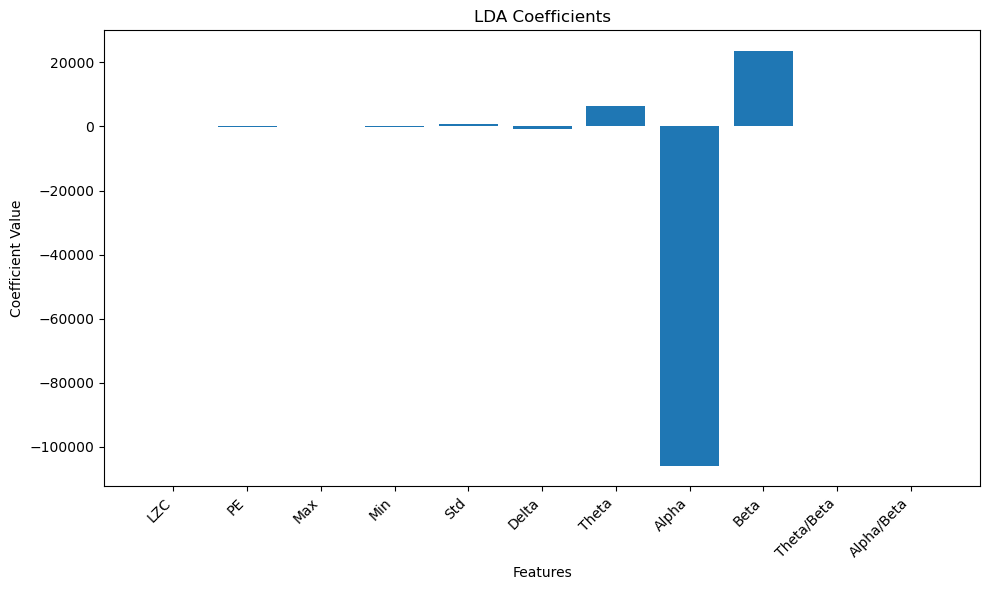

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['3-1', '3-2'].png


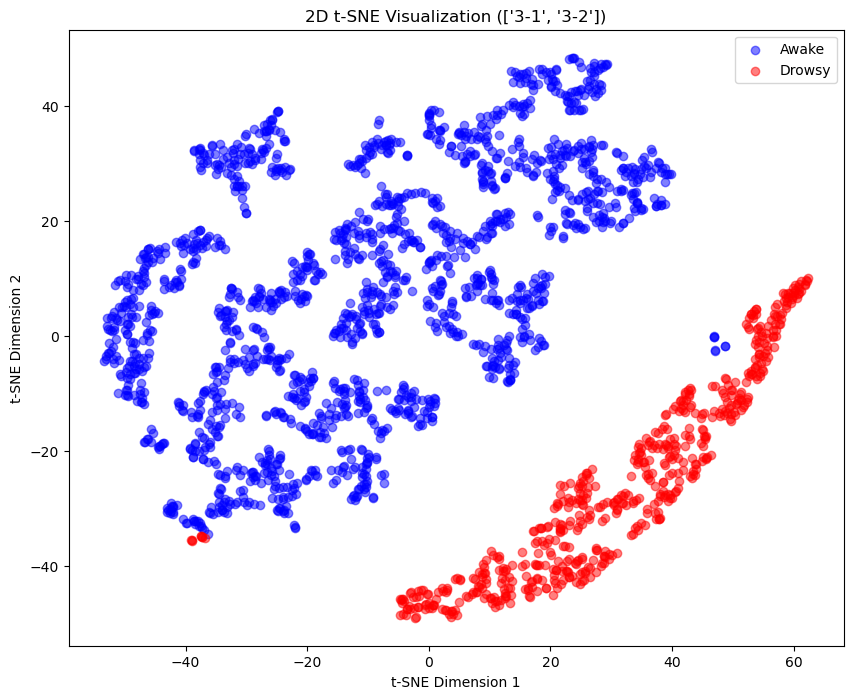

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['3-1', '3-2']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['3-1', '3-2']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['3-1', '3-2']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['3-1', '3-2']_angle_135.png


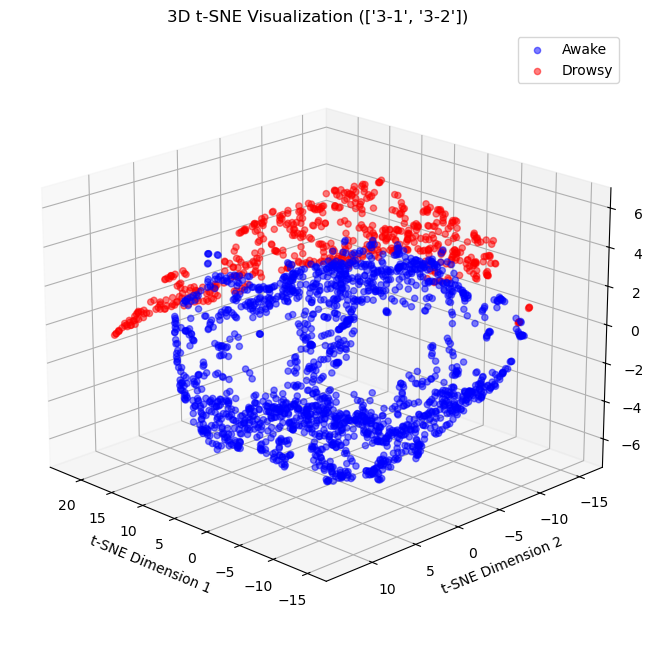

['4-2', '4-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (3528, 11)
ラベルの形状: (3528,)
[[-3.21807562e-01 -3.54593232e+01  9.94744177e+00  3.40955261e+01
  -3.47462106e+02  3.27116391e+03  2.06775561e+03 -1.96437192e+04
   2.15333632e+04  1.54440270e-01  4.27722074e+00]]
saved: <built-in function getcwd>/results/LDA_['4-2', '4-3'].png


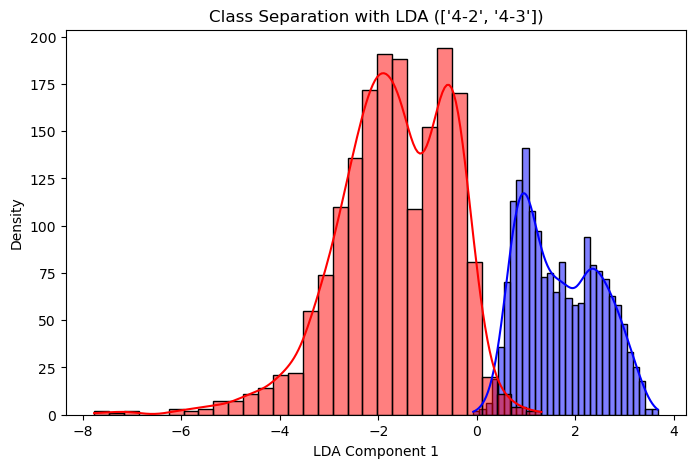

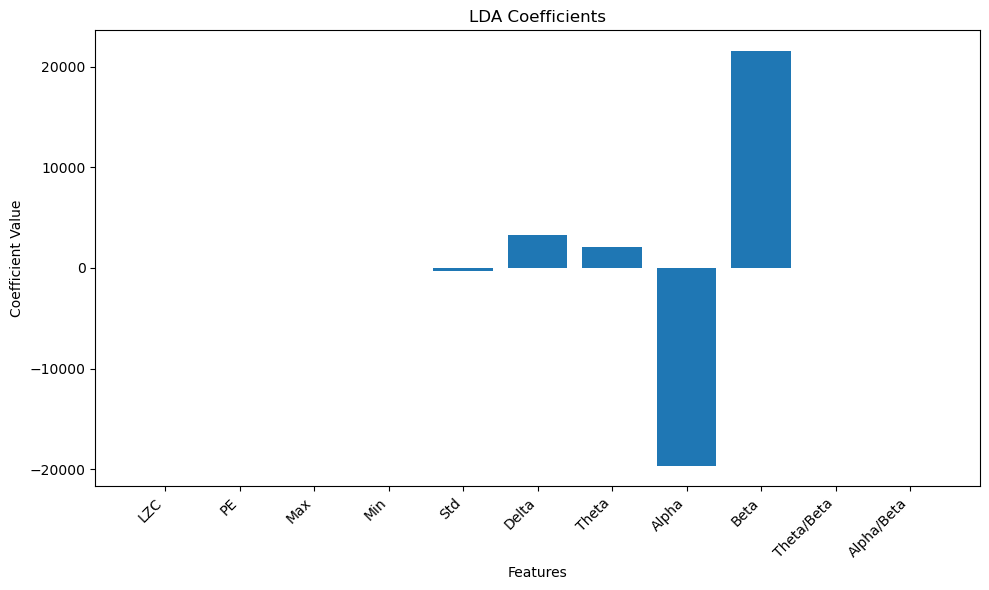

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['4-2', '4-3'].png


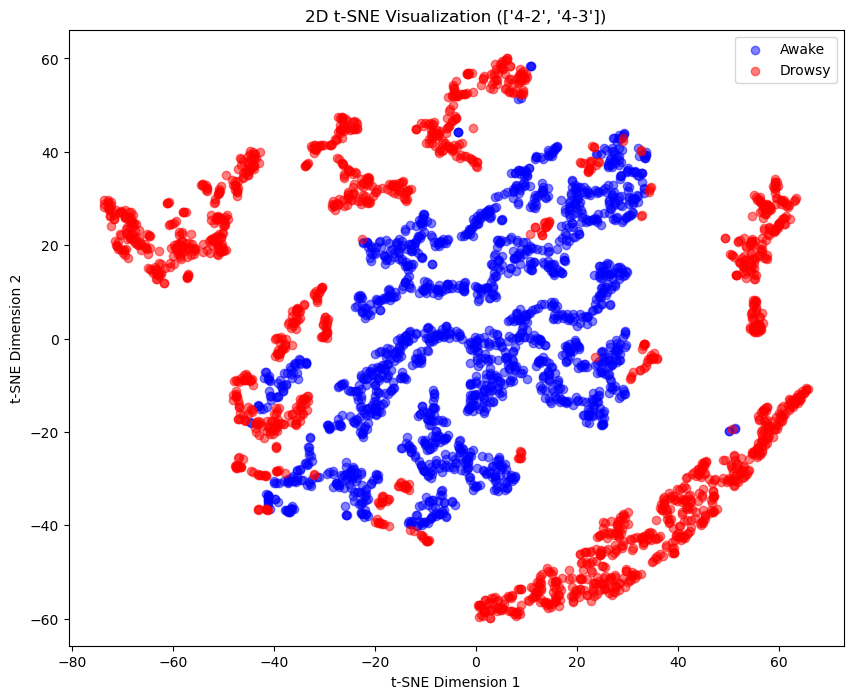

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['4-2', '4-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['4-2', '4-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['4-2', '4-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['4-2', '4-3']_angle_135.png


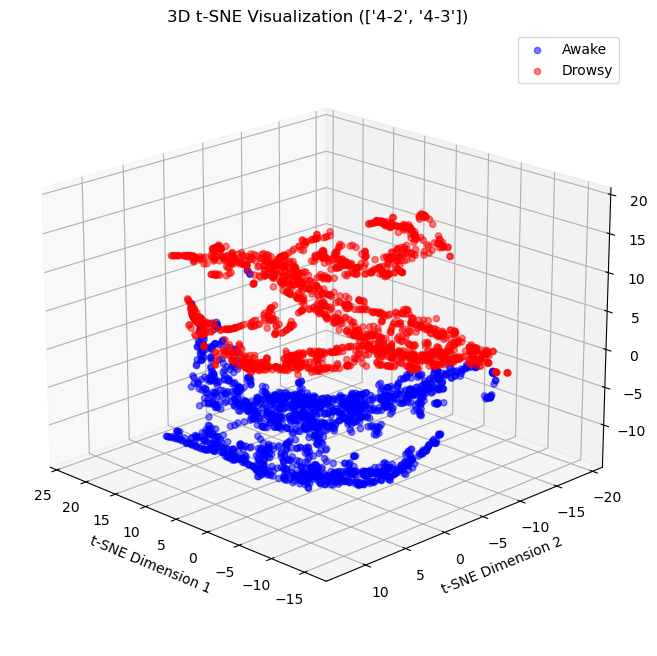

['5-1', '5-2', '5-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (5292, 11)
ラベルの形状: (5292,)
[[ 7.15780465e+00 -3.57076449e+01  1.41500936e+01  3.33060179e+01
  -2.76242149e+02  2.15645771e+03  5.09816688e+03 -4.31292406e+03
   1.09662416e+04  2.60425221e-01  3.27913654e+00]]
saved: <built-in function getcwd>/results/LDA_['5-1', '5-2', '5-3'].png


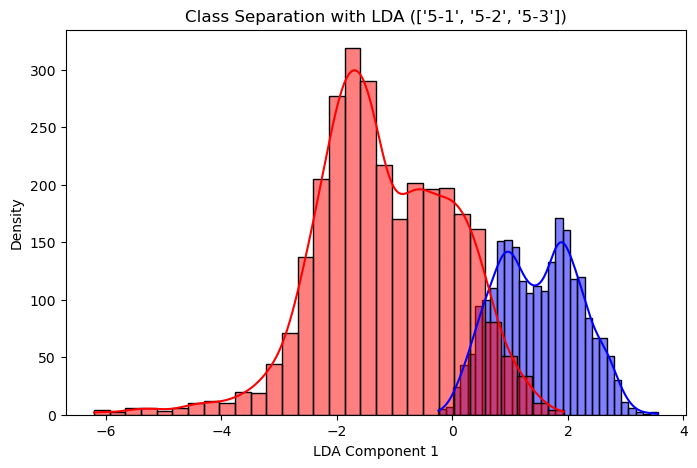

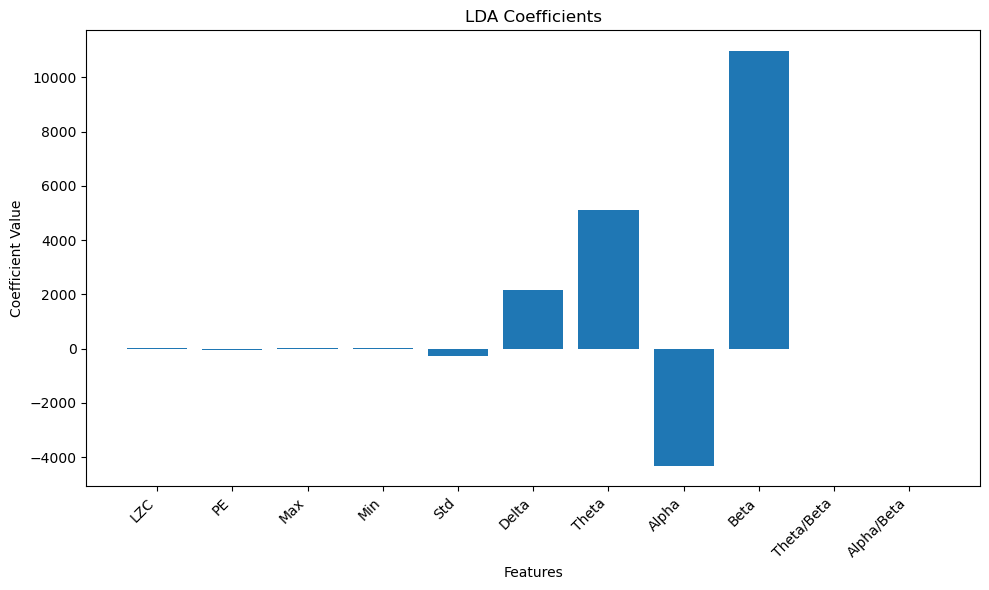

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['5-1', '5-2', '5-3'].png


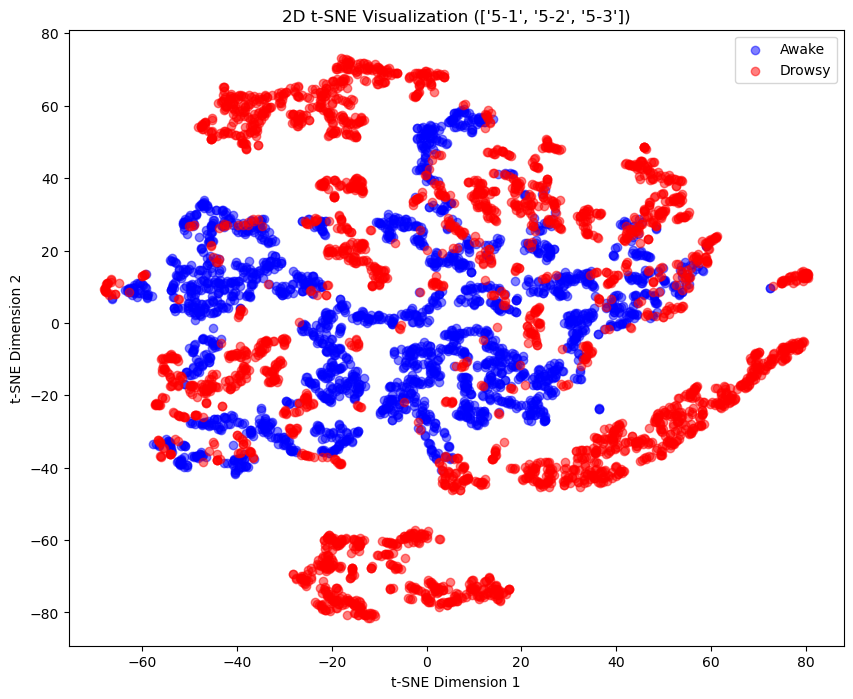

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['5-1', '5-2', '5-3']_angle_135.png


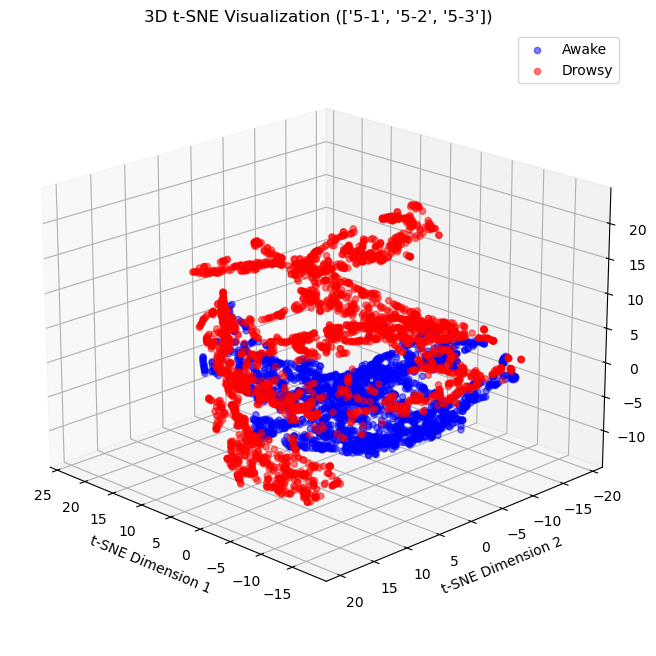

['6-1', '6-2', '6-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (7056, 11)
ラベルの形状: (7056,)
[[-8.31424675e+00 -5.03935751e+01  7.66596369e+00  2.91597082e+01
  -1.84894878e+02  1.79039614e+03  2.10122386e+03 -3.48144715e+03
   1.06734656e+04  1.18043882e+00  3.61643673e+00]]
saved: <built-in function getcwd>/results/LDA_['6-1', '6-2', '6-3'].png


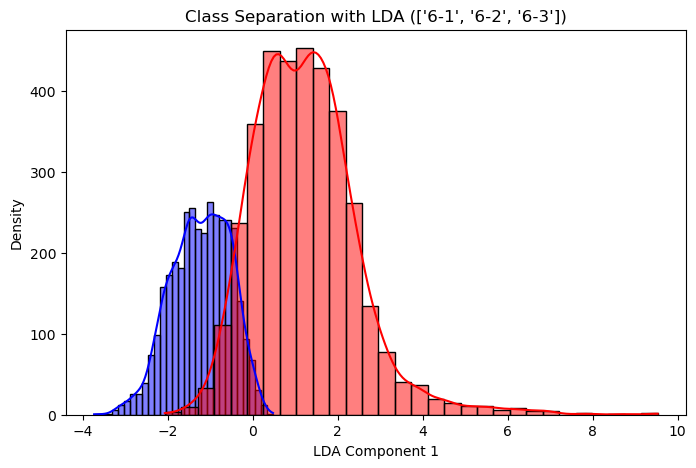

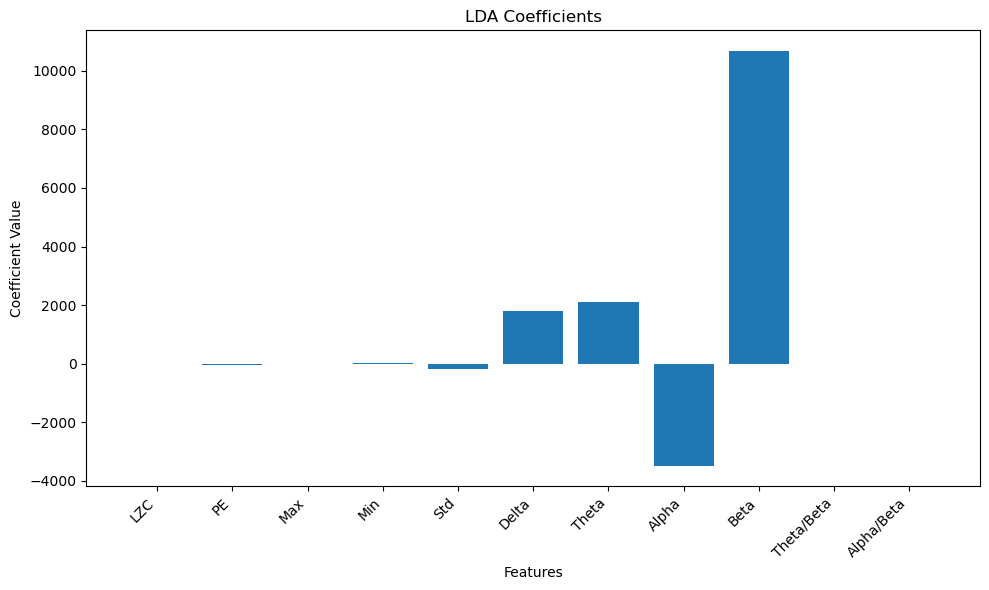

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['6-1', '6-2', '6-3'].png


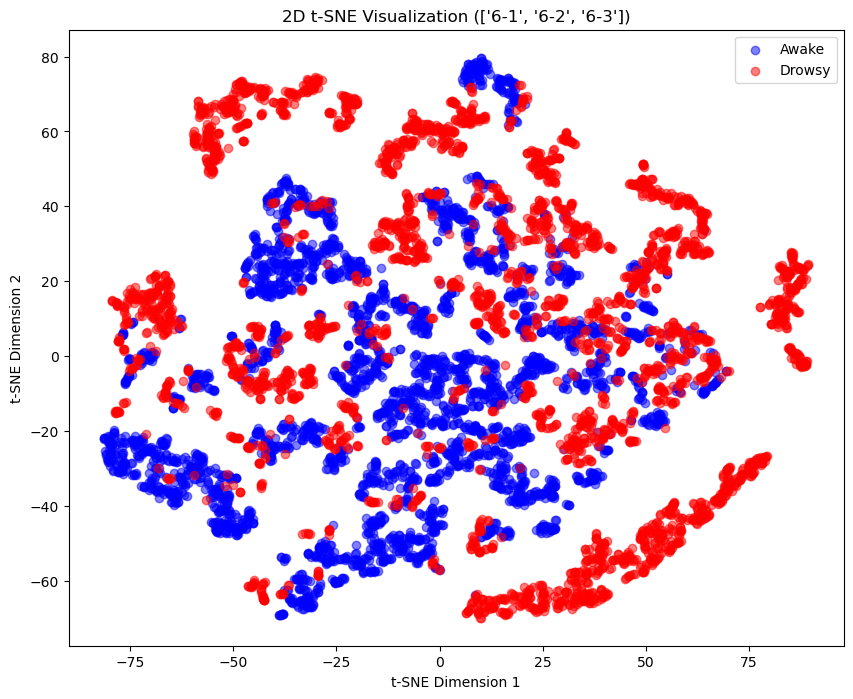

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['6-1', '6-2', '6-3']_angle_135.png


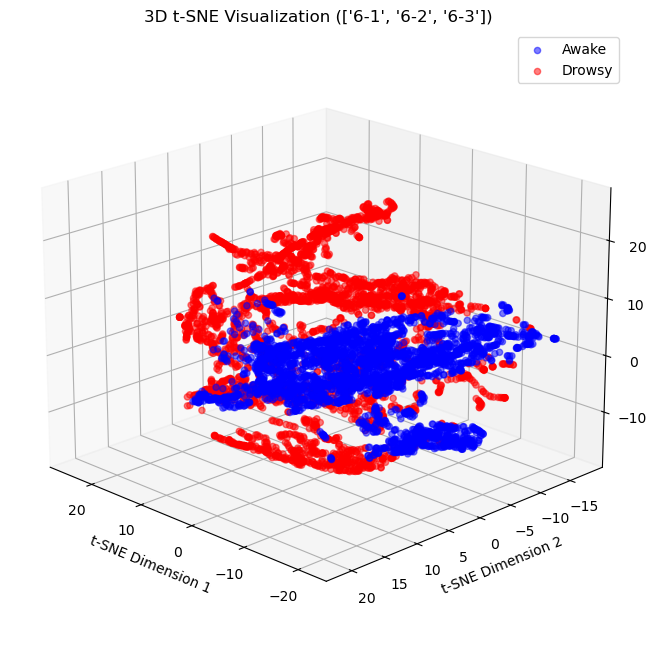

['7-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (7644, 11)
ラベルの形状: (7644,)
[[-5.09436075e+00 -5.43039553e+01  4.36830482e+00  3.04444486e+01
  -1.82670643e+02  1.86091341e+03  3.31409828e+03 -3.33819582e+03
   1.00340534e+04  7.54995355e-01  3.56747958e+00]]
saved: <built-in function getcwd>/results/LDA_['7-3'].png


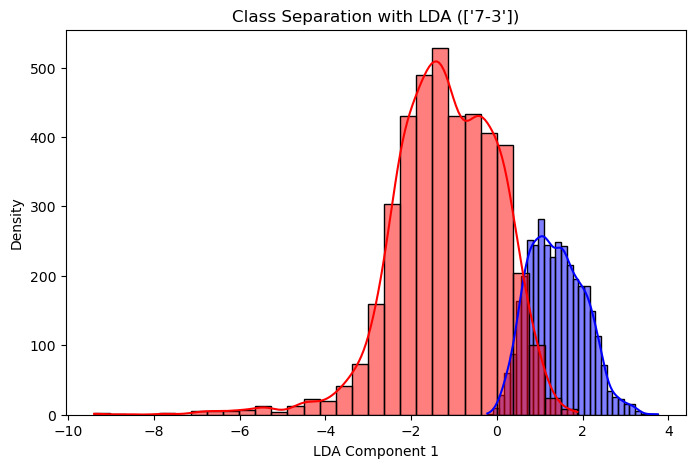

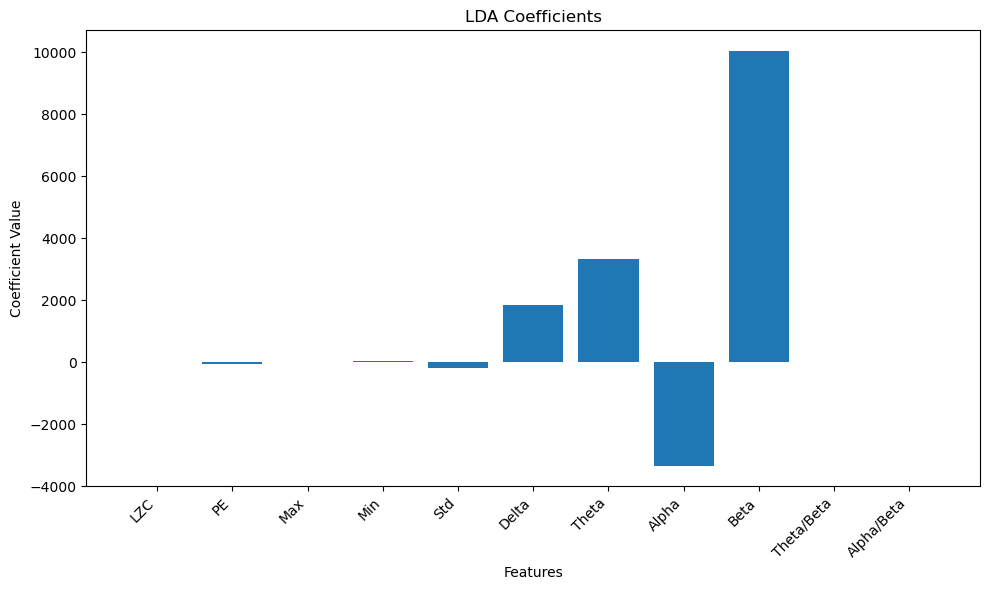

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['7-3'].png


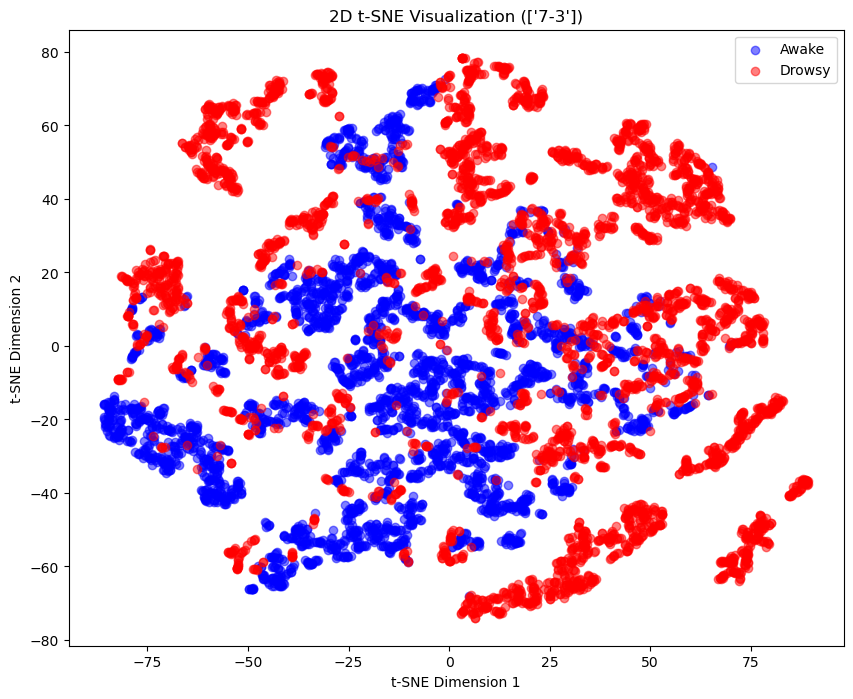

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['7-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['7-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['7-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['7-3']_angle_135.png


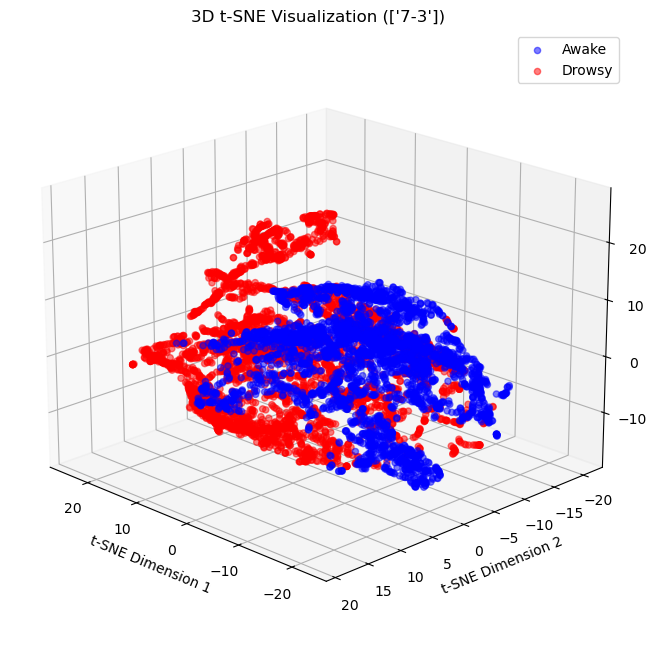

['8-1', '8-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (8820, 11)
ラベルの形状: (8820,)
[[ 7.52874440e-02 -5.87320670e+01 -2.76454109e-01  2.27713586e+01
  -7.25691693e+01  1.17791607e+03  1.58827995e+03 -3.04715524e+03
   7.83874175e+03  9.69180095e-01  2.64060077e+00]]
saved: <built-in function getcwd>/results/LDA_['8-1', '8-3'].png


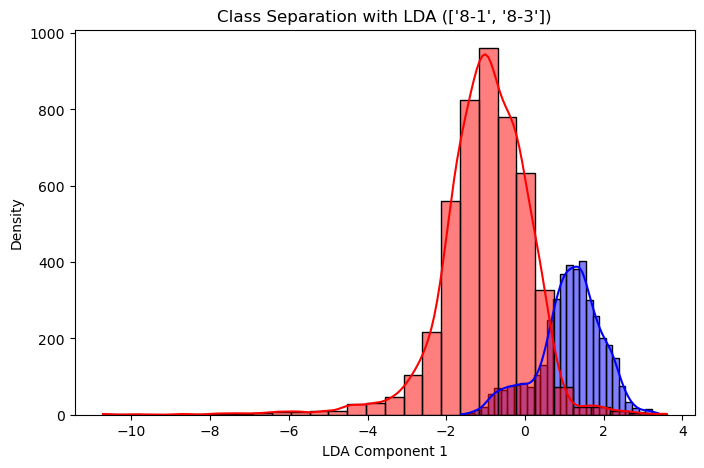

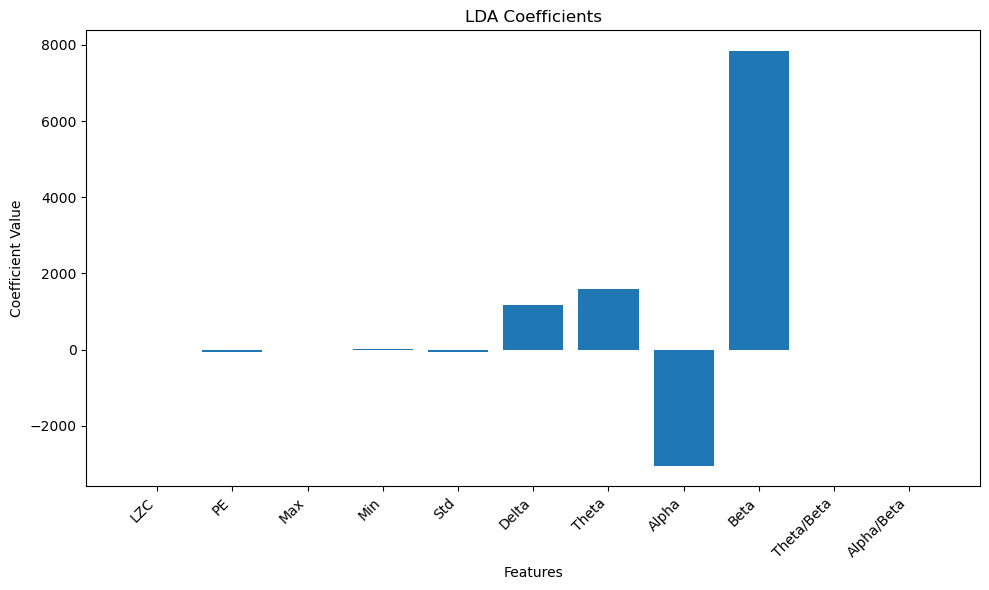

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['8-1', '8-3'].png


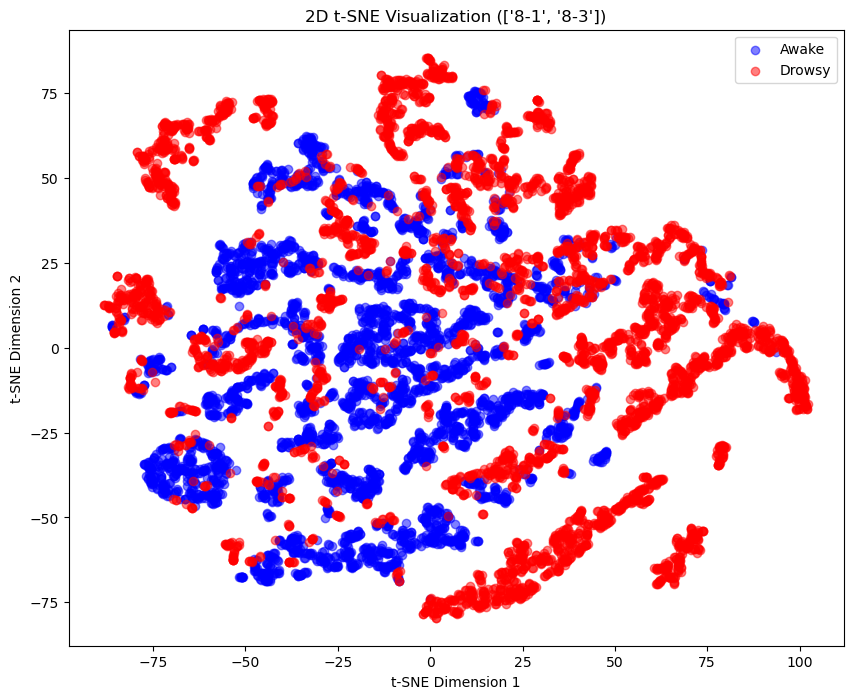

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['8-1', '8-3']_angle_135.png


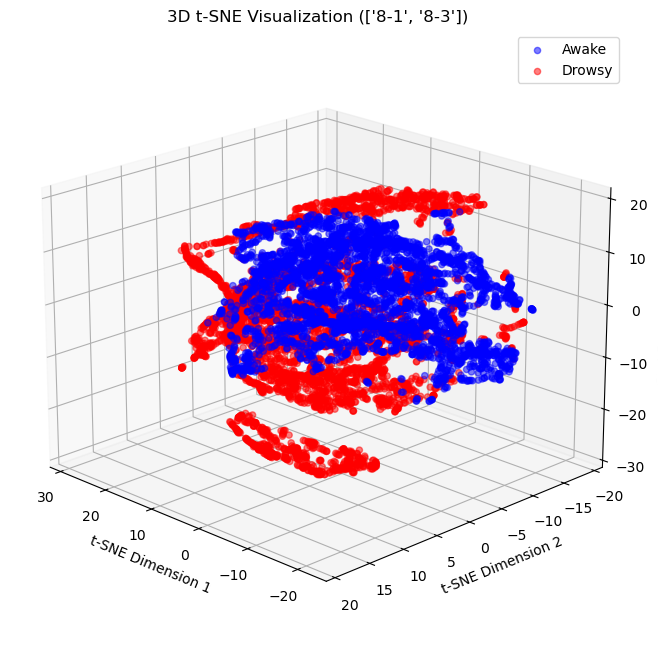

['9-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (9408, 11)
ラベルの形状: (9408,)
[[-5.76150752e-01 -6.10488720e+01  5.70595196e-02  2.35526101e+01
  -7.86966676e+01  1.24207107e+03  2.08109948e+03 -2.88750476e+03
   7.52409569e+03  8.06689116e-01  2.58928082e+00]]
saved: <built-in function getcwd>/results/LDA_['9-3'].png


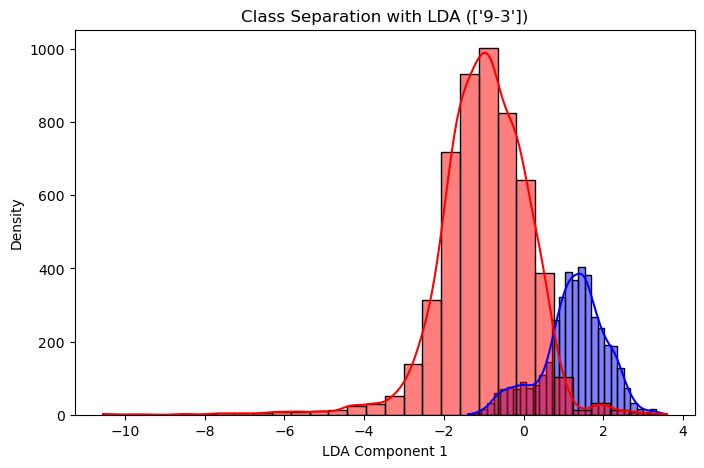

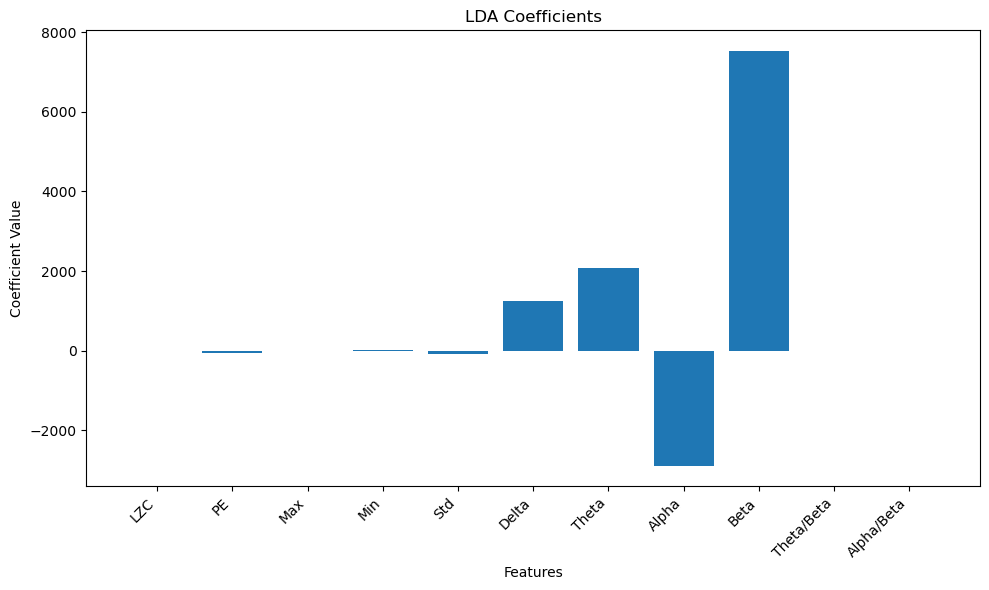

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['9-3'].png


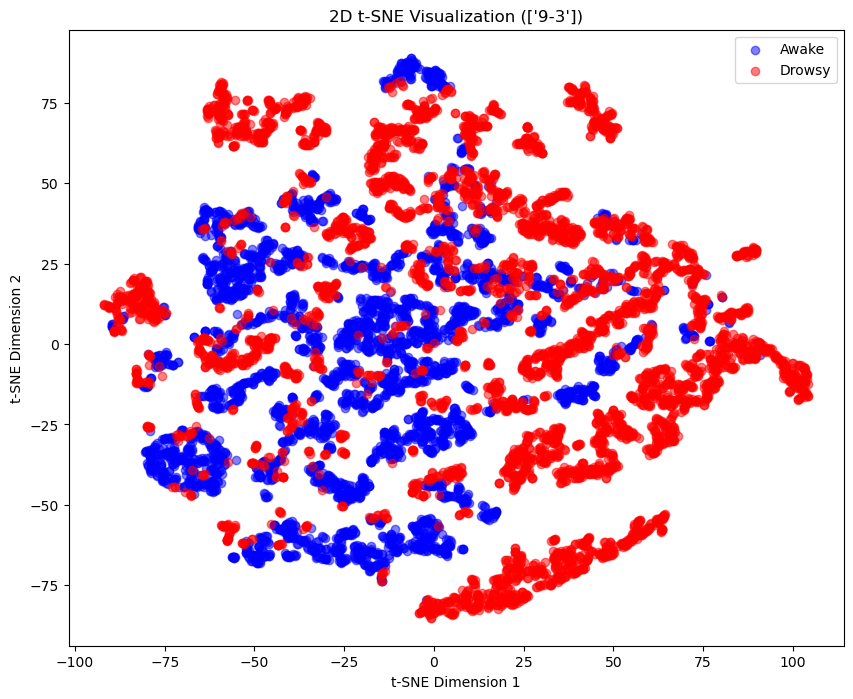

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['9-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['9-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['9-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['9-3']_angle_135.png


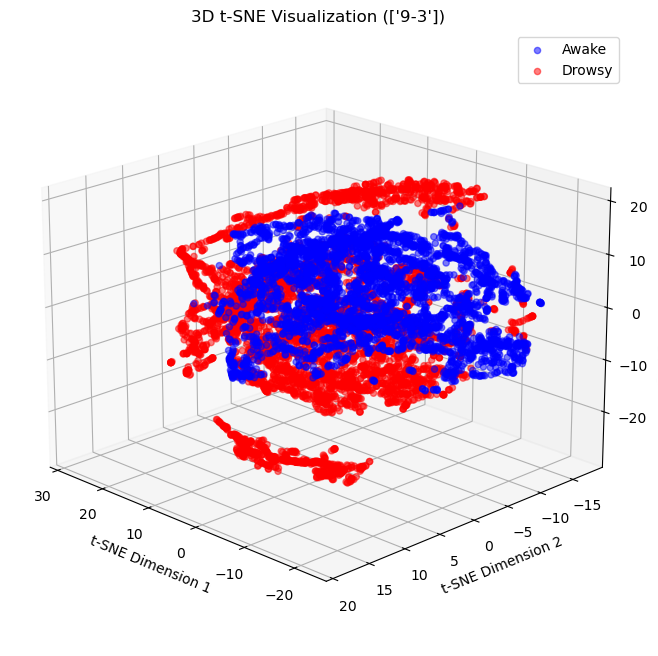

['10-1', '10-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (10584, 11)
ラベルの形状: (10584,)
[[ 2.67141935e+00 -5.61270292e+01  7.52746580e+00  1.71861640e+01
  -1.19685054e+02  1.24647235e+03  1.23164057e+03 -2.77888499e+03
   6.79216684e+03  8.91489245e-01  2.45514258e+00]]
saved: <built-in function getcwd>/results/LDA_['10-1', '10-3'].png


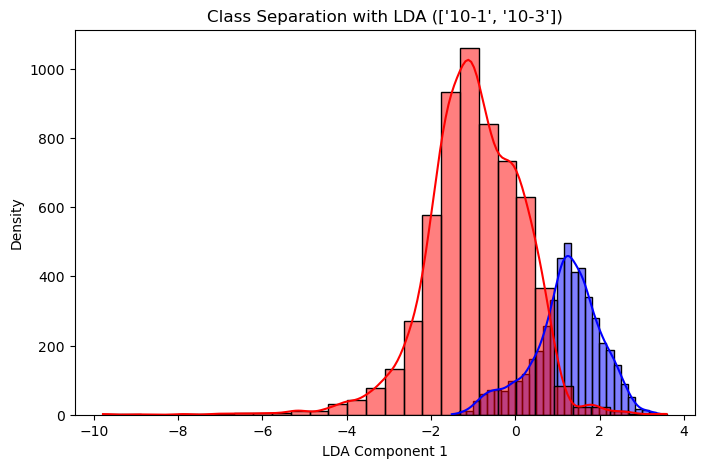

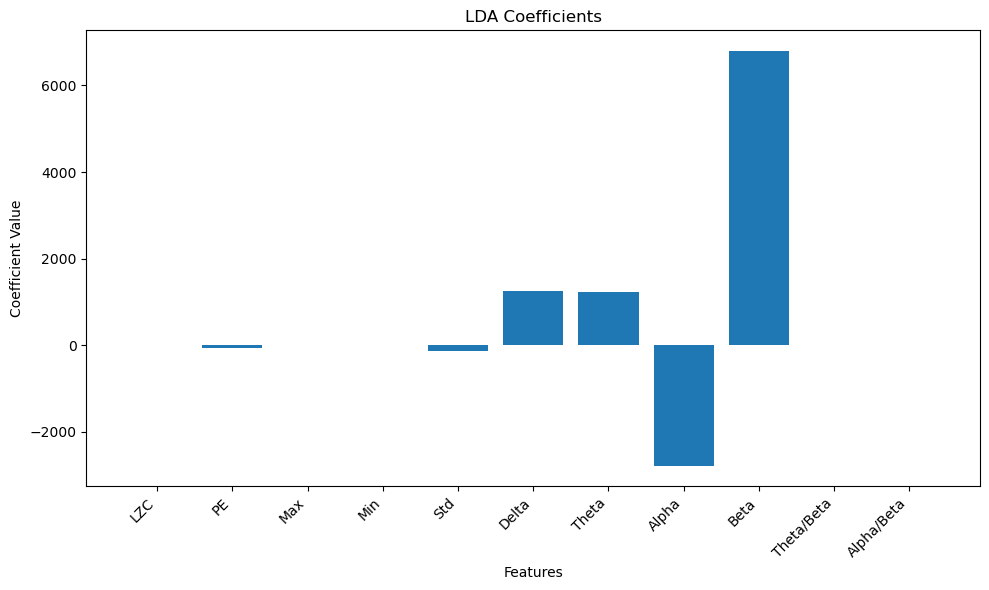

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['10-1', '10-3'].png


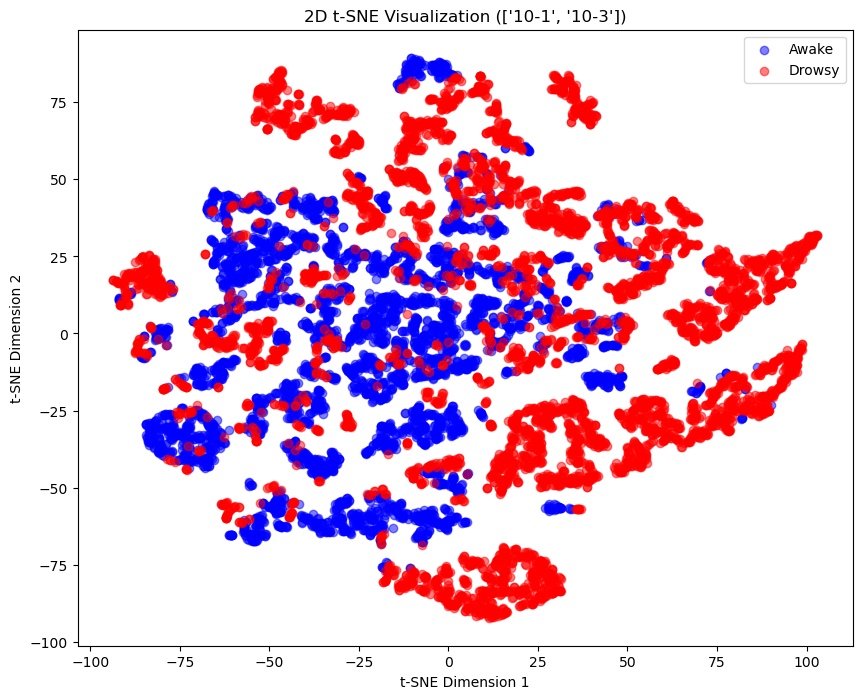

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['10-1', '10-3']_angle_135.png


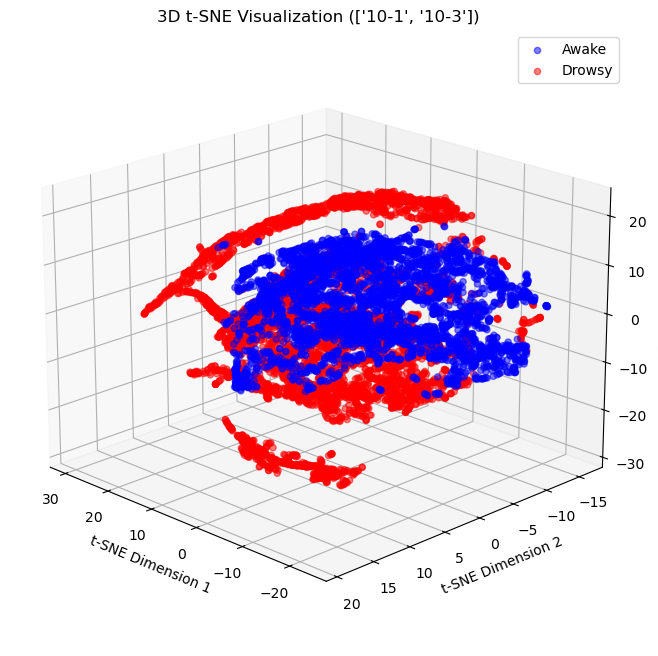

['11-2', '11-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (11760, 11)
ラベルの形状: (11760,)
[[ 1.34404970e+00 -6.04928853e+01  1.03337145e+01  1.61788542e+01
  -1.44080676e+02  1.44226355e+03  1.30004681e+03 -1.46093021e+03
   5.49810494e+03  5.13960972e-01  1.59288719e+00]]
saved: <built-in function getcwd>/results/LDA_['11-2', '11-3'].png


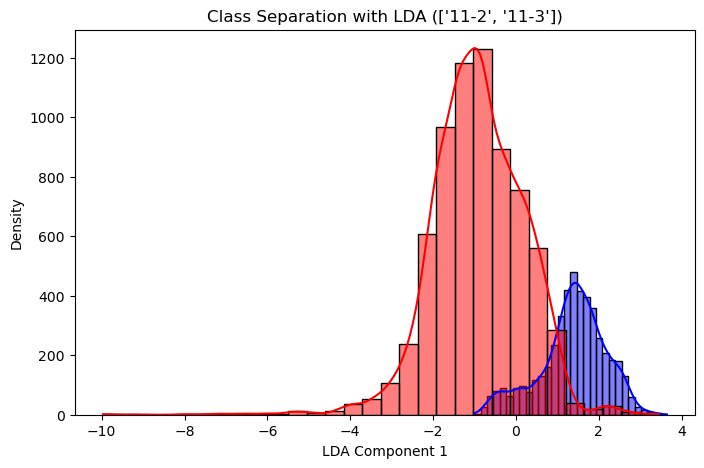

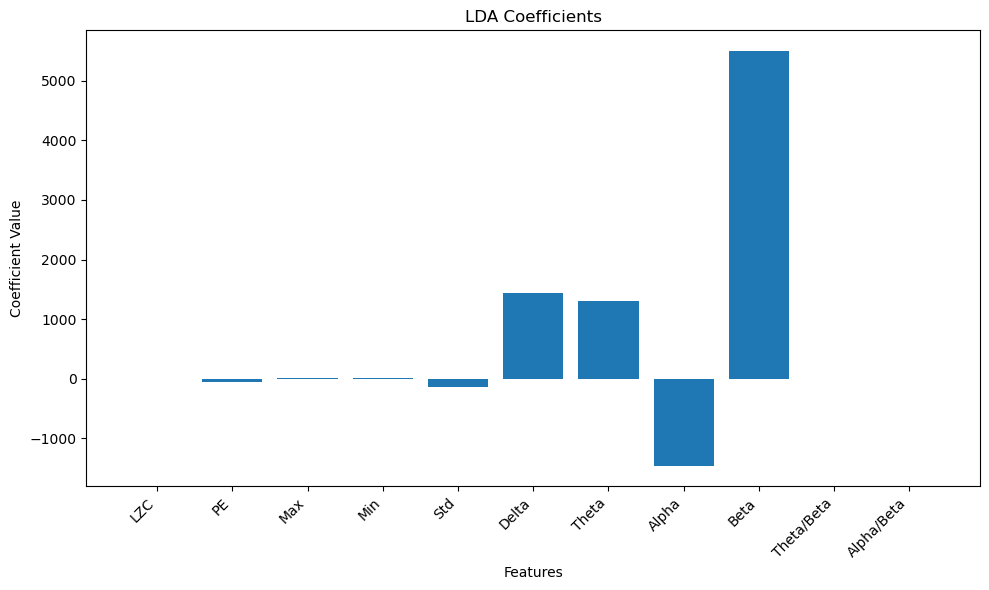

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['11-2', '11-3'].png


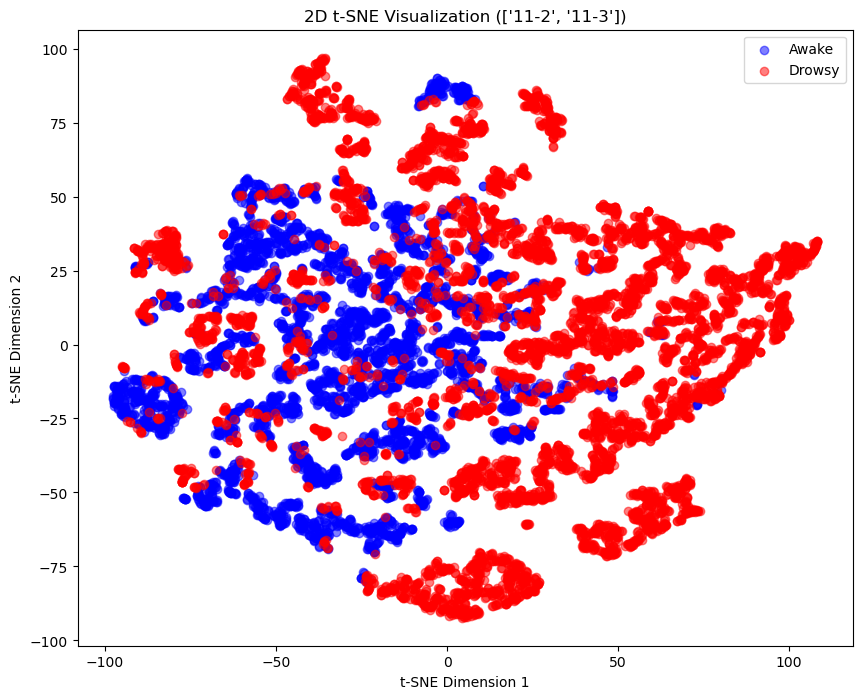

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['11-2', '11-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['11-2', '11-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['11-2', '11-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['11-2', '11-3']_angle_135.png


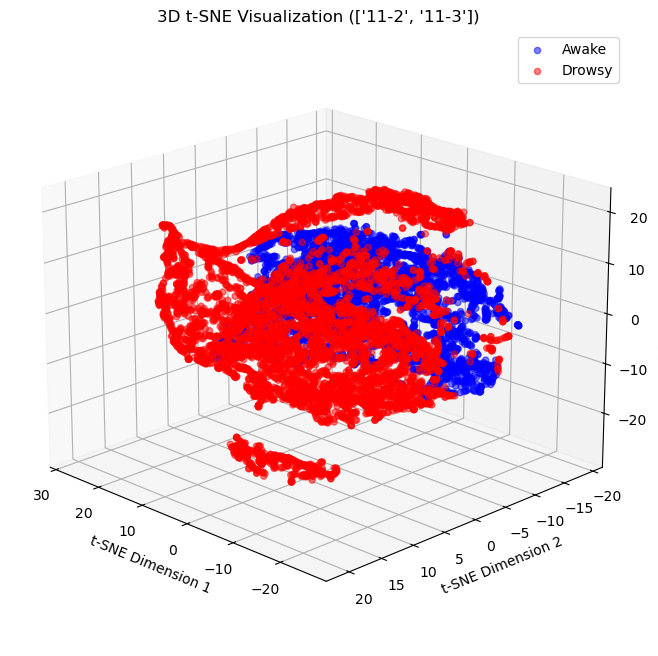

['12-1']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (12348, 11)
ラベルの形状: (12348,)
[[ 7.38868650e+00 -7.24114395e+01  6.61274306e+00  1.50801205e+01
  -1.12408052e+02  1.31854989e+03  6.20881911e+02 -1.04323917e+03
   5.14446292e+03  7.76099052e-01  9.88646637e-01]]
saved: <built-in function getcwd>/results/LDA_['12-1'].png


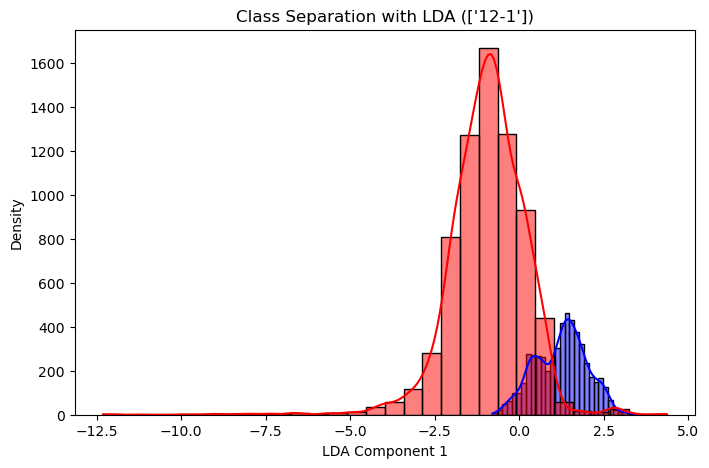

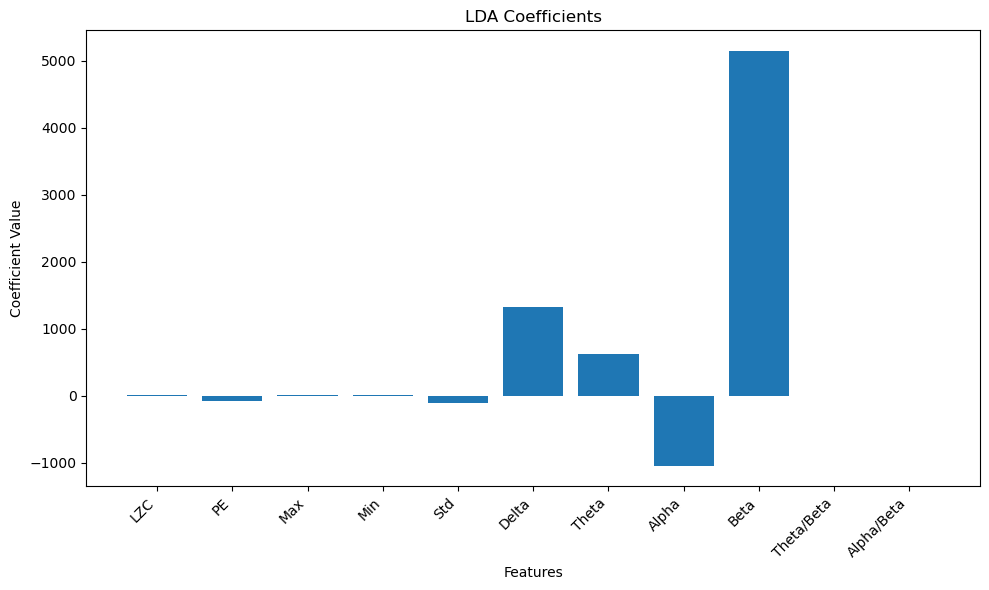

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['12-1'].png


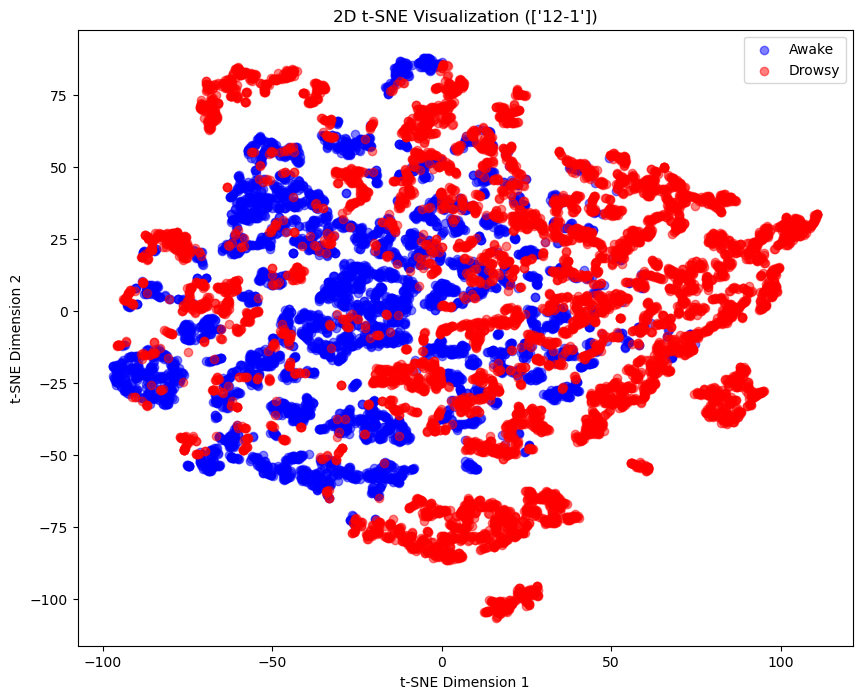

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['12-1']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['12-1']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['12-1']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['12-1']_angle_135.png


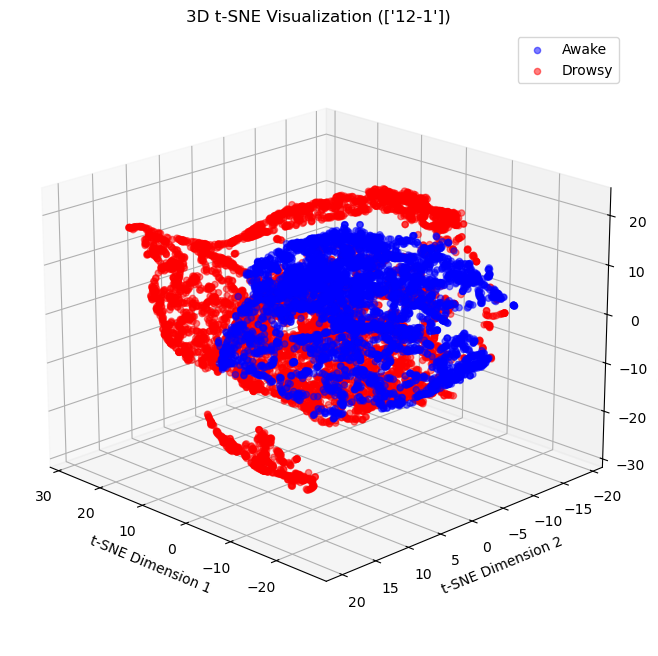

['13-2']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (12936, 11)
ラベルの形状: (12936,)
[[ 4.93969140e+00 -6.65022691e+01  5.66992655e+00  1.62036793e+01
  -1.17596969e+02  1.21072890e+03  1.20473154e+03 -7.70890262e+02
   5.40134607e+03  5.33168179e-01  1.26868569e+00]]
saved: <built-in function getcwd>/results/LDA_['13-2'].png


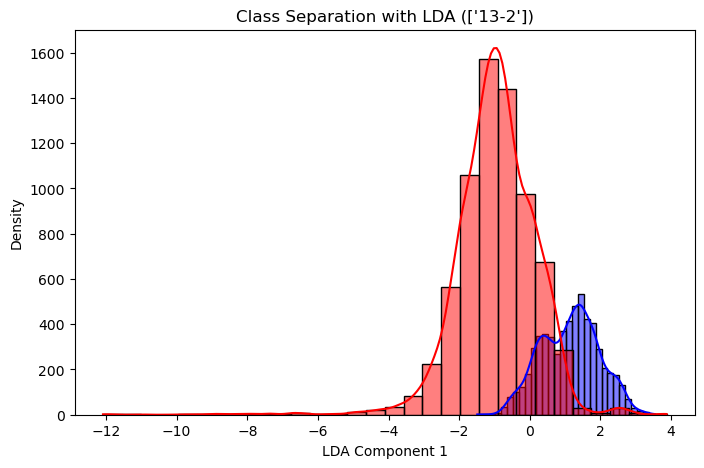

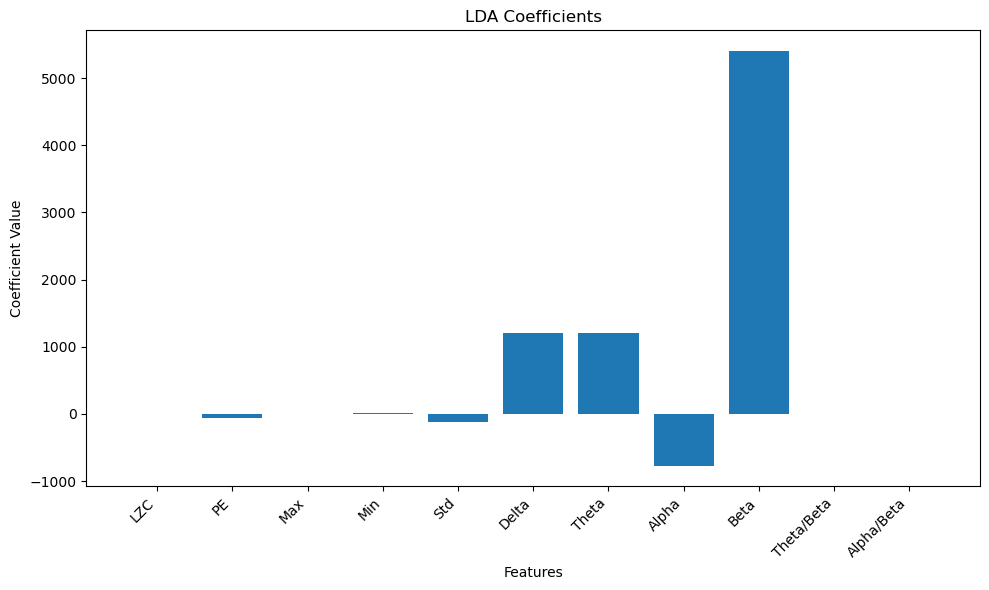

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['13-2'].png


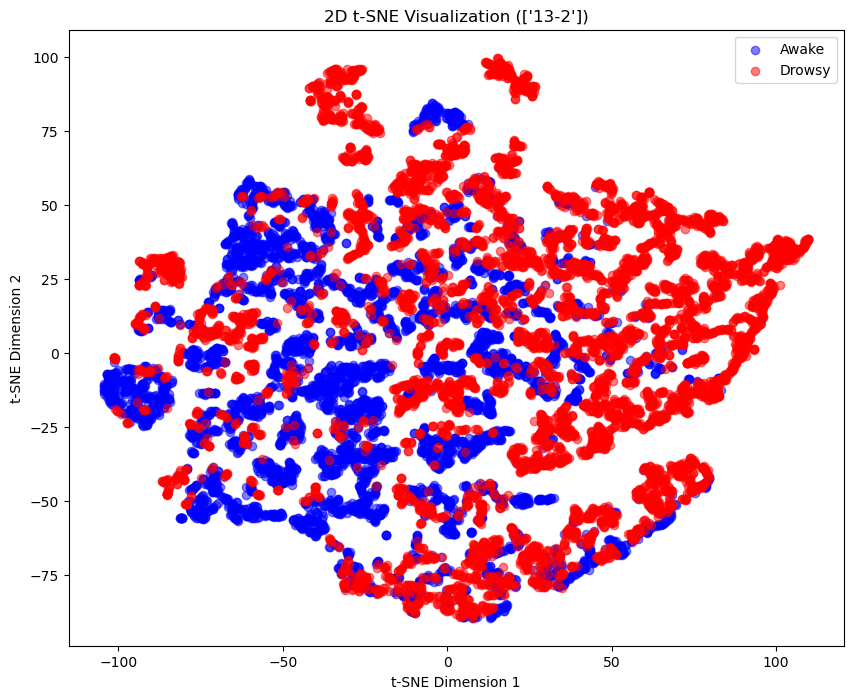

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['13-2']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['13-2']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['13-2']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['13-2']_angle_135.png


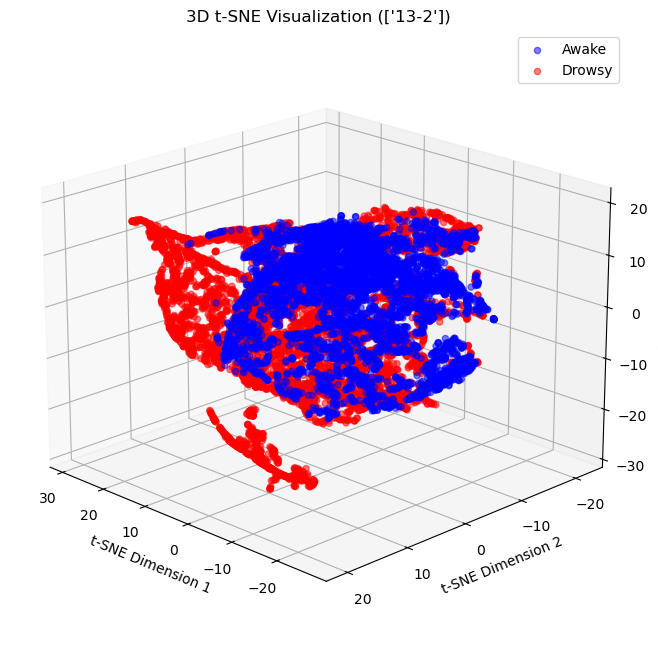

['14-2', '14-3']
----------------------------------------
セグメントされたデータの取り出しが完了しました。
----------------------------------------
セグメントされたデータの取り出しが完了しました。
データの形状: (14112, 11)
ラベルの形状: (14112,)
[[ 5.47493138e+00 -6.16934829e+01  6.20178365e+00  1.56116312e+01
  -1.21233928e+02  1.22634805e+03  1.45643621e+03 -7.94970817e+02
   4.71948814e+03  4.18578842e-01  1.68917835e+00]]
saved: <built-in function getcwd>/results/LDA_['14-2', '14-3'].png


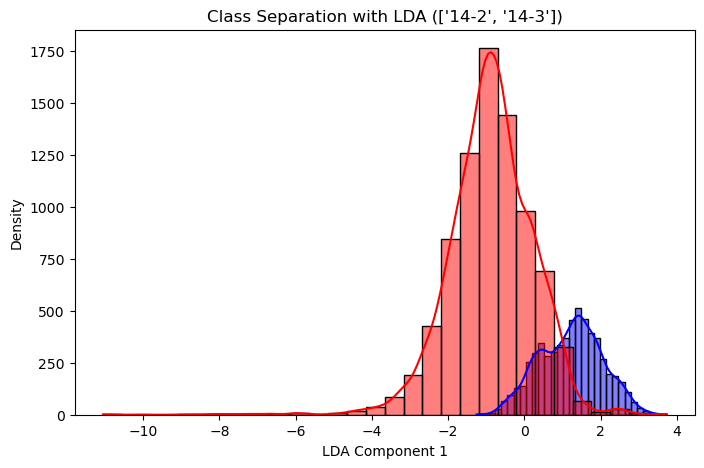

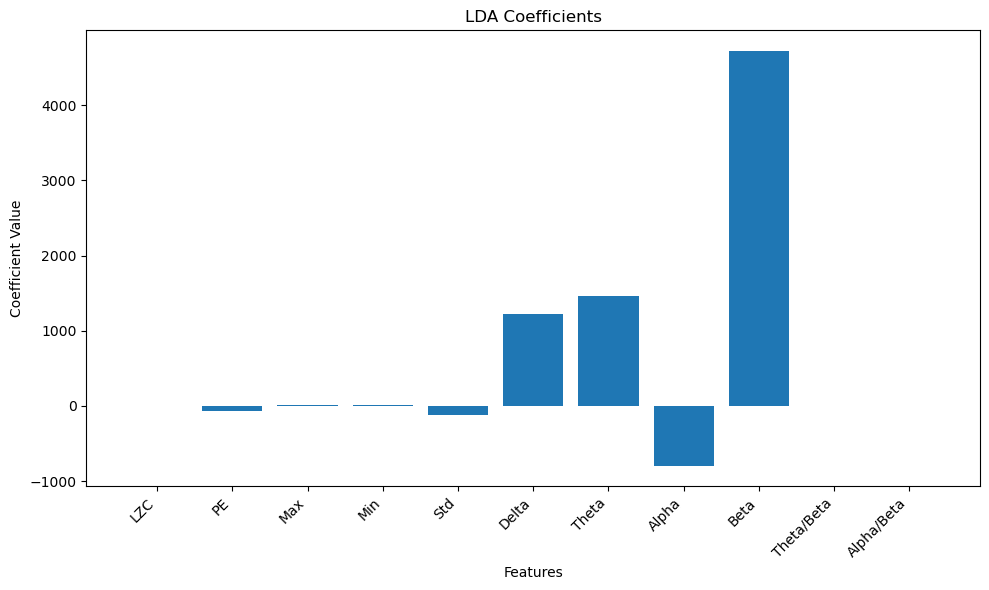

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_2D_['14-2', '14-3'].png


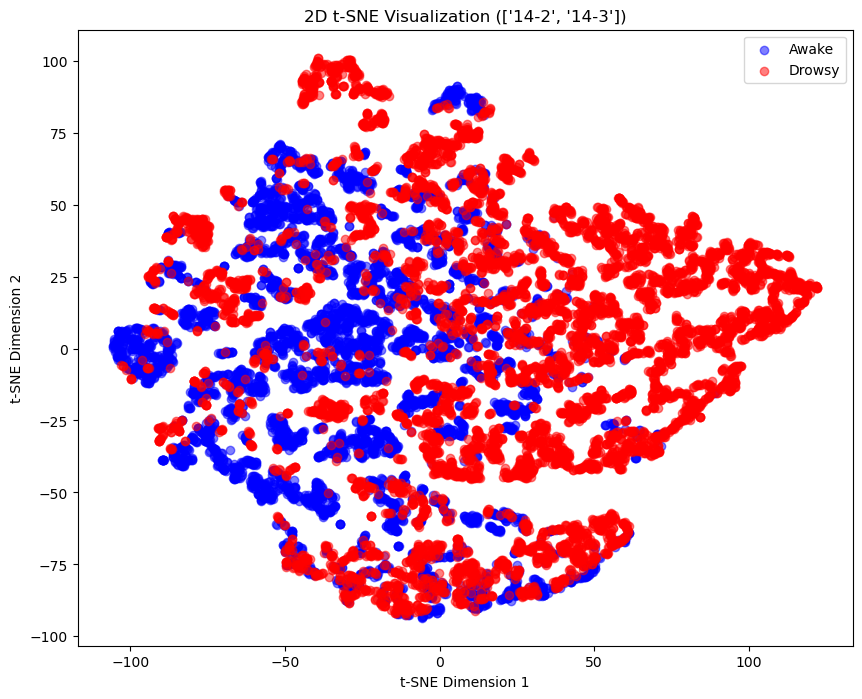

saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['14-2', '14-3']_angle_0.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['14-2', '14-3']_angle_45.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['14-2', '14-3']_angle_90.png
saved: c:\Users\taki\Desktop\drowsiness_detection_independent/results/tSNE_3D_['14-2', '14-3']_angle_135.png


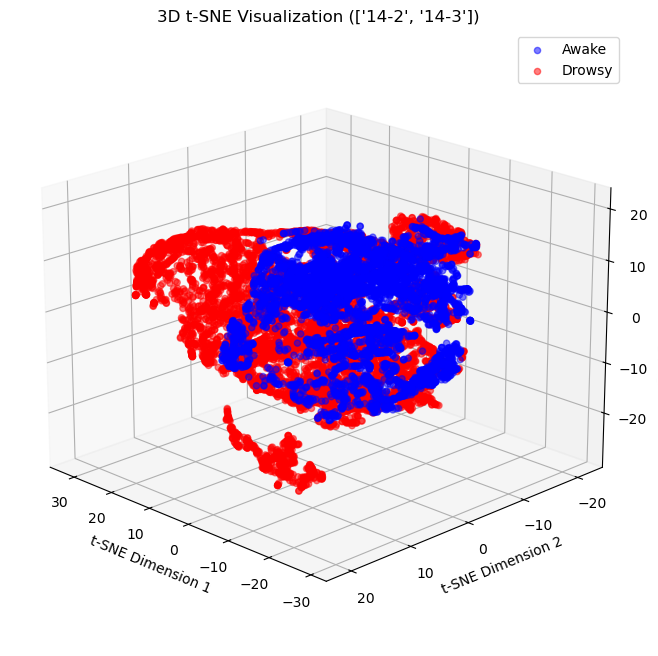

In [16]:

subj_list = [
    ["1-1", "1-3"], 
    ["2-1", "2-2"], 
    ["3-1", "3-2"],
    ["4-2", "4-3"],
    ["5-1", "5-2", "5-3"],
    ["6-1", "6-2", "6-3"],
    ["7-3"],
    ["8-1", "8-3"],
    ["9-3"],
    ["10-1", "10-3"],
    ["11-2", "11-3"],
    ["12-1"],
    ["13-2"],
    ["14-2", "14-3"]
]

test_subj_list = [["1-1", "1-3"]]  # テスト被験者

train_subj_list = [subj for subj in subj_list if subj not in test_subj_list]

train_segments = []
train_labels = []


for experiments in train_subj_list:
    print(experiments)
    for subj_experiment in experiments:
        segments = need_utils.get_segments_from_split_data(split_data_dic, subj_experiment)
        label = list(split_data_dic[subj_experiment].keys()) * len(segments)
        train_segments.append(segments)
        train_labels.append(label)

    EEG_data = np.concatenate(np.array(train_segments), axis=0)
    labels = np.concatenate(np.array(train_labels), axis=0)

    features = extract_features(EEG_data)

    print("データの形状:", features.shape)
    print("ラベルの形状:", labels.shape)

    # LDAによる可視化
    lda = visualize_LDA(features, labels, experiments)
    # t-SNEによる可視化
    tsne_2d, tsne_3d = visualize_tSNE(features, labels, experiments)

### 未完成

In [ ]:
### test

for experiments in test_subj_list:
    print(experiments)
    for subj_experiment in experiments:
        segments = need_utils.get_segments_from_split_data(split_data_dic, subj_experiment)
        label = list(split_data_dic[subj_experiment].keys()) * len(segments)

        features = extract_features(EEG_data)

        print("データの形状:", features.shape)
        print("ラベルの形状:", labels.shape)

    # LDAによる可視化
    lda = visualize_LDA(features, labels, experiments)
    # t-SNEによる可視化
    tsne_2d, tsne_3d = visualize_tSNE(features, labels, experiments)
